In [1]:
%pip install mplhep

/usr/lib/python3/dist-packages/secretstorage/dhcrypto.py:15: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/usr/lib/python3/dist-packages/secretstorage/util.py:19: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
Note: you may need to restart the kernel to use updated packages.


In [2]:
import nn_module as nnm
import torch
import numpy as np
import numpy.ma as ma
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
import math
import time
import copy
import pandas as pd
from pandas import read_csv
import argparse
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.ticker import FixedLocator
from matplotlib import colors as colors
import mplhep as hep

In [3]:
out_file = '15708_2'
pp = PdfPages(f'./graphs/{out_file}_custom_graphs.pdf')

In [4]:
# The mapping between the WC names and their positions in the data
# There are Combine 1D scans over all 16 WCs
names = {}
names['cQei'] = 0
names['cQl3i'] = 1
names['cQlMi'] = 2
names['cbW'] = 3
names['cpQ3'] = 4
names['cpQM'] = 5
names['cpt'] = 6
names['cptb'] = 7
names['ctG'] = 8
names['ctW'] = 9
names['ctZ'] = 10
names['ctei'] = 11
names['ctlSi'] = 12
names['ctlTi'] = 13
names['ctli'] = 14
names['ctp'] = 15

# Pairs of WCs in existing Combine 2D scans
WC2d_1 = ['cpQ3', 'cpQM', 'cpt', 'cptb', 'cQei', 'ctei', 'ctli', 'ctW'] # The first of the two WCs to graph
WC2d_2 = ['cbW', 'ctG', 'ctp', 'cQl3i', 'cQlMi', 'ctlTi', 'ctlSi', 'ctZ'] # The second of the two WCs to graph


In [5]:
# LaTeX codes for WC labels
labels = {}
labels['cQei'] = r'$\mathit{c}_{Qe}^{(\mathit{\ell})}/\Lambda^2[TeV^{-2}]$'
labels['cQl3i'] = r'$\mathit{c}_{Q\mathit{\ell}}^{3(\mathit{\ell})}/\Lambda^2[TeV^{-2}]$'
labels['cQlMi'] = r'$\mathit{c}_{Q\mathit{\ell}}^{-(\mathit{\ell})}/\Lambda^2[TeV^{-2}]$'
labels['cbW'] = r'$\mathit{c}_{bW}/\Lambda^2[TeV^{-2}]$'
labels['cpQ3'] = r'$\mathit{c}_{\mathit{\varphi}Q}^3/\Lambda^2[TeV^{-2}]$'
labels['cpQM'] = r'$\mathit{c}_{\mathit{\varphi}Q}^-/\Lambda^2[TeV^{-2}]$'
labels['cpt'] = r'$\mathit{c}_{\mathit{\varphi}t}/\Lambda^2[TeV^{-2}]$'
labels['cptb'] = r'$\mathit{c}_{\mathit{\varphi}tb}/\Lambda^2[TeV^{-2}]$'
labels['ctG'] = r'$\mathit{c}_{tG}/\Lambda^2[TeV^{-2}]$'
labels['ctW'] = r'$\mathit{c}_{tW}/\Lambda^2[TeV^{-2}]$'
labels['ctZ'] = r'$\mathit{c}_{tZ}/\Lambda^2[TeV^{-2}]$'
labels['ctei'] = r'$\mathit{c}_{te}^{(\mathit{\ell})}/\Lambda^2[TeV^{-2}]$'
labels['ctlSi'] = r'$\mathit{c}_t^{\mathit{S}(\mathit{\ell})}/\Lambda^2[TeV^{-2}]$'
labels['ctlTi'] = r'$\mathit{c}_t^{\mathit{T}(\mathit{\ell})}/\Lambda^2[TeV^{-2}]$'
labels['ctli'] = r'$\mathit{c}_{t\mathit{\ell}}^{(\mathit{\ell})}/\Lambda^2[TeV^{-2}]$'
labels['ctp'] = r'$\mathit{c}_{t\mathit{\varphi}}/\Lambda^2[TeV^{-2}]$'

In [6]:
hep.style.use(hep.style.ROOT)

In [7]:
# Load training data
train_data = np.load(f'../saved_graphs/{out_file}_train.npz', allow_pickle=True)

In [8]:
# Load validation data
#validation_data = np.load(f'./saved_graphs/{out_file}_validation.npz', allow_pickle=True)
validation_data = np.load(f'./saved_graphs/{out_file}_validation.npz', allow_pickle=True)

In [9]:
# Training graphs
graphs = {}
graph_data = dict(train_data)

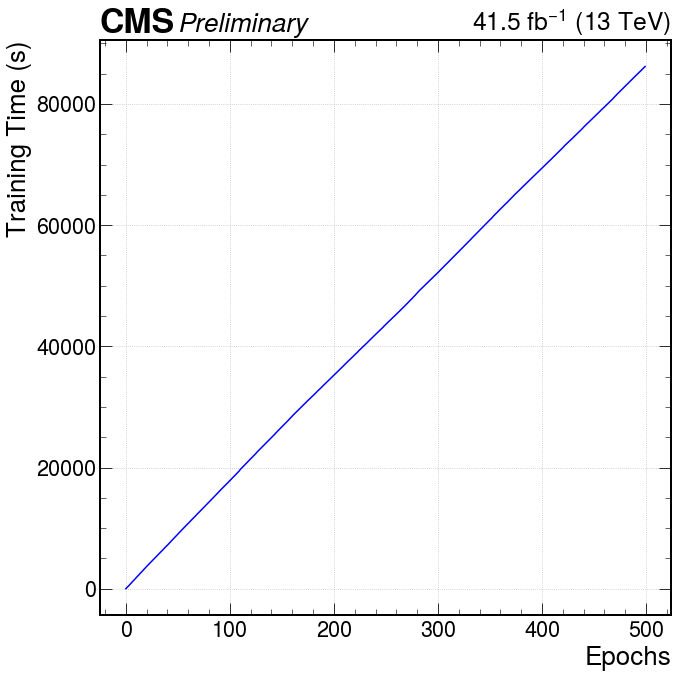

In [10]:
# Time graph
graphs['fig_time'], graphs['ax_time'] = plt.subplots()
hep.cms.label('Preliminary', data=True, lumi=41.5)
graphs['ax_time'].plot(graph_data['time_epochs'], graph_data['time_vals'], 'b-')
graphs['ax_time'].grid()
graphs['ax_time'].set_xlabel('Epochs')
graphs['ax_time'].set_ylabel('Training Time (s)')
graphs['fig_time'].tight_layout()

In [11]:
# Save the graph
pp.savefig(graphs['fig_time'])

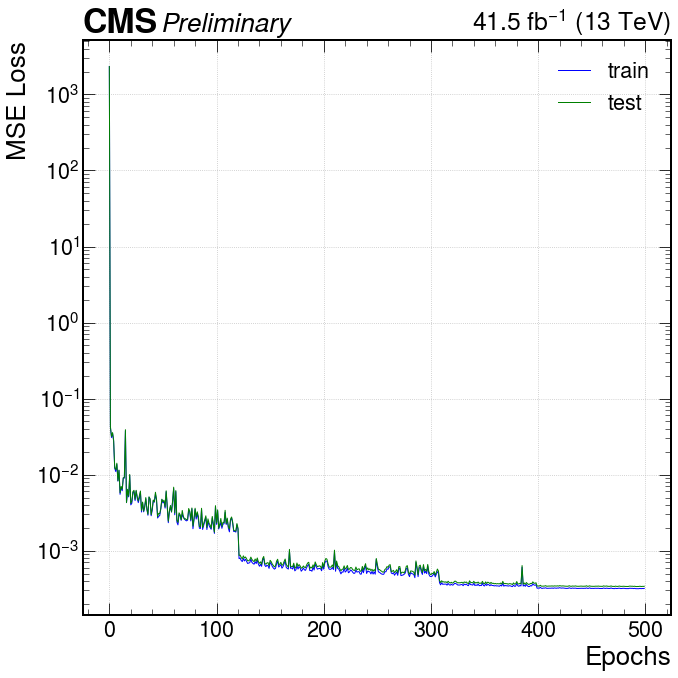

In [12]:
# Loss curve
graphs['fig_loss'], graphs['ax_loss'] = plt.subplots()
hep.cms.label('Preliminary', data=True, lumi=41.5)
train_loss_line, = graphs['ax_loss'].plot(graph_data['train_loss_epochs'], graph_data['train_loss_vals'], 'b-', linewidth=1)
test_loss_line, = graphs['ax_loss'].plot(graph_data['test_loss_epochs'], graph_data['test_loss_vals'], 'g-', linewidth=1)
graphs['ax_loss'].grid()
graphs['ax_loss'].legend([train_loss_line, test_loss_line], ['train', 'test'])
graphs['ax_loss'].set_xlabel('Epochs')
graphs['ax_loss'].set_ylabel('MSE Loss')
graphs['ax_loss'].set_yscale('log')
graphs['fig_loss'].tight_layout()

In [13]:
# Save the graph
pp.savefig(graphs['fig_loss'])

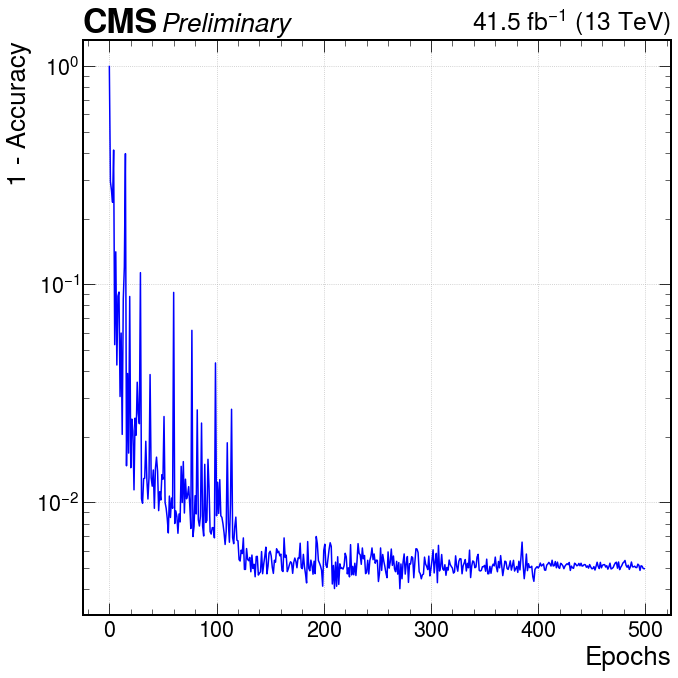

In [14]:
# Accuracy curve
graphs['fig_accu'], graphs['ax_accu'] = plt.subplots()
hep.cms.label('Preliminary', data=True, lumi=41.5)
graphs['ax_accu'].plot(graph_data['accu_epochs'], 1 - graph_data['accu_vals'], 'b-')
graphs['ax_accu'].grid()
graphs['ax_accu'].set_xlabel('Epochs')
graphs['ax_accu'].set_ylabel('1 - Accuracy')
graphs['ax_accu'].set_yscale('log')
graphs['fig_accu'].tight_layout()

In [15]:
# Save the graph
pp.savefig(graphs['fig_accu'])

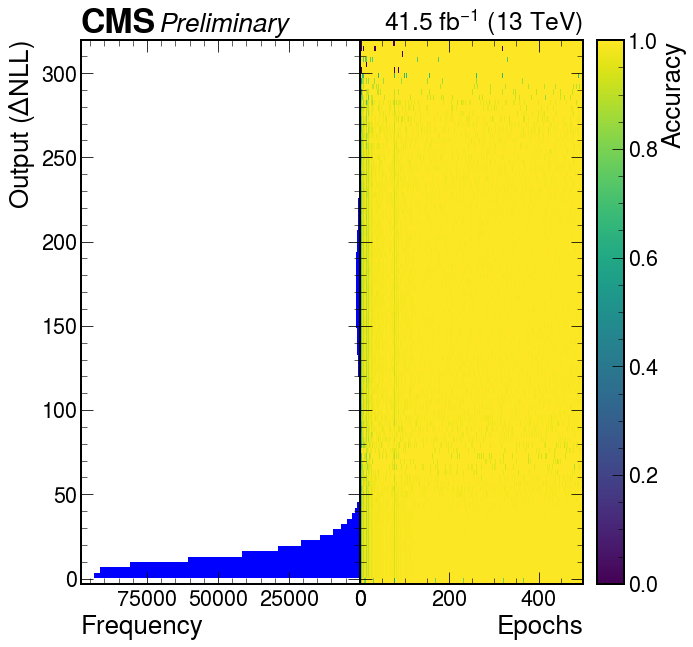

In [16]:
# Data distribution and movie plots
graphs['fig_accu_out'], (graphs['ax_out_freq'], graphs['ax_accu_out']) = plt.subplots(nrows=1, ncols=2, sharey = True)
hep.cms.label(exp='', data=True, lumi=41.5, ax=graphs['ax_accu_out'])
hep.cms.text(text='Preliminary', ax=graphs['ax_out_freq'])
# Didn't save parameters in file, so cheat a little
im = graphs['ax_accu_out'].pcolormesh(np.arange(-0.5, graph_data['time_epochs'].max()+1 , 1), graph_data['accu_out_grid'], graph_data['accu_out_grid_accu'])
graphs['ax_accu_out'].set_xlabel('Epochs')
graphs['fig_accu_out'].colorbar(im, ax=graphs['ax_accu_out'], label='Accuracy')

graphs['ax_out_freq'].hist(graph_data['test_outputs'], bins=graph_data['accu_out_grid'], orientation='horizontal', color='b')
graphs['ax_out_freq'].invert_xaxis()
graphs['ax_out_freq'].set_xlabel('Frequency', loc='left')
graphs['ax_out_freq'].set_ylabel(r'$Output\ (\Delta NLL)$')
#graphs['ax_out_freq'].set_xlim(100000)
#graphs['ax_out_freq'].margins(0)
graphs['fig_accu_out'].subplots_adjust(wspace=0)
#graphs['fig_accu_out'].tight_layout()

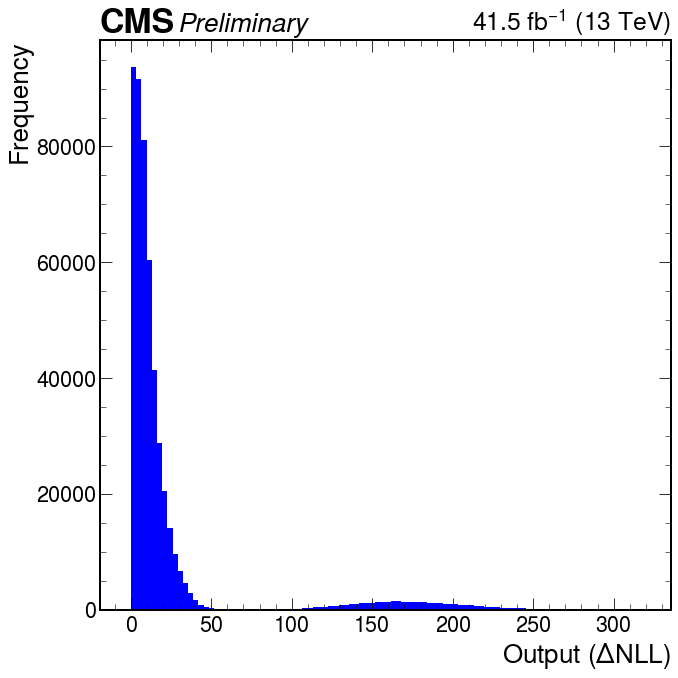

In [17]:
# Data distribution plot for DP note
graphs['fig_out_freq'], graphs['ax_out_freq'] = plt.subplots()
hep.cms.label('Preliminary', data=True, lumi=41.5)
graphs['ax_out_freq'].hist(graph_data['test_outputs'], bins=graph_data['accu_out_grid'], color='b')
graphs['ax_out_freq'].set_xlabel(r'$Output\ (\Delta NLL)$')
graphs['ax_out_freq'].set_ylabel('Frequency')
graphs['fig_out_freq'].tight_layout()

In [18]:
# Save the graph
pp.savefig(graphs['fig_out_freq'])

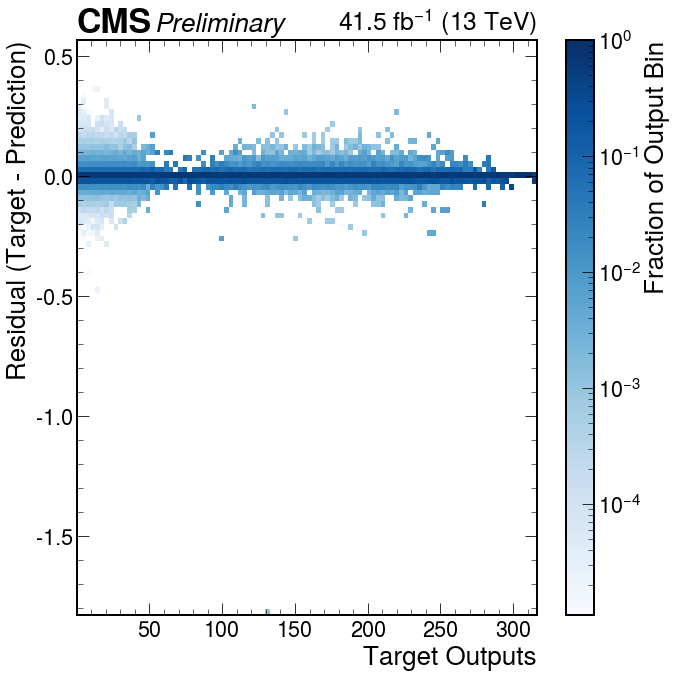

In [19]:
# Residual plot
graphs['fig_out_residual'], graphs['ax_out_residual'] = plt.subplots()
num_bins_out = 100
num_bins_res = 100
h = graphs['ax_out_residual'].hist(graph_data['test_outputs'], num_bins_out)
out_bin_idx = np.digitize(graph_data['test_outputs'], h[1])-1
out_bin_idx[np.where(out_bin_idx==num_bins_out)] = num_bins_out - 1
out_weights = 1 / h[0][out_bin_idx]
graphs['ax_out_residual'].clear()
hep.cms.label('Preliminary', data=True, lumi=41.5)
h = graphs['ax_out_residual'].hist2d(graph_data['test_outputs'], graph_data['out_residual_vals'], [num_bins_out, num_bins_res], weights=out_weights, norm=colors.LogNorm(), cmap='Blues')
graphs['ax_out_residual'].set_xlabel('Target Outputs')
graphs['ax_out_residual'].set_ylabel('Residual (Target - Prediction)')
graphs['fig_out_residual'].colorbar(h[3], ax=graphs['ax_out_residual'], label='Fraction of Output Bin')
#graphs['ax_out_residual'].set_xlim(0,100)
#graphs['ax_out_residual'].set_ylim(-2,2)
graphs['fig_out_residual'].tight_layout()

In [20]:
# Save the graph
pp.savefig(graphs['fig_out_residual'])

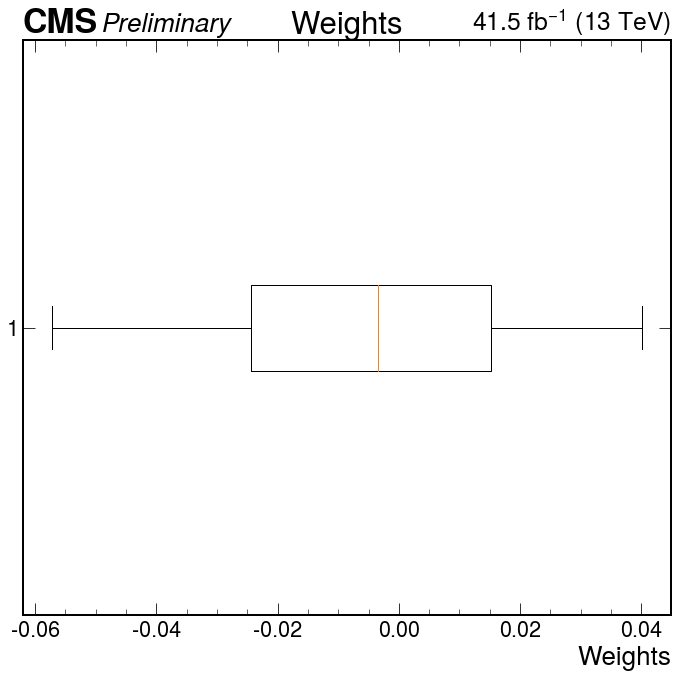

In [21]:
# Weights plot
graphs['fig_weights'], graphs['ax_weights'] = plt.subplots()
hep.cms.label('Preliminary', data=True, lumi=41.5)
w1 = graphs['ax_weights'].boxplot(graph_data['weights'], vert = 0, whis = (5,95),showfliers=False)
graphs['ax_weights'].set_xlabel('Weights')
graphs['ax_weights'].title.set_text('Weights')
graphs['fig_weights'].tight_layout()

In [22]:
# Save the graph
pp.savefig(graphs['fig_weights'])

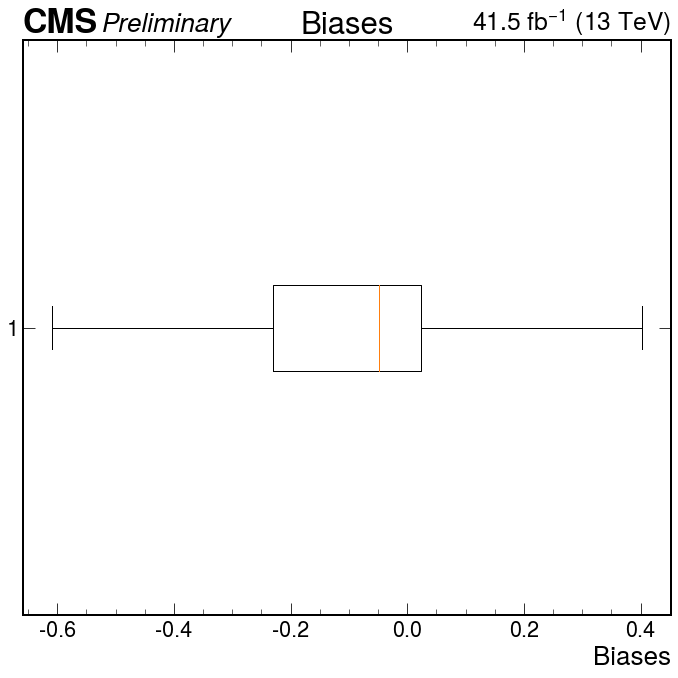

In [23]:
# Biases plot
graphs['fig_biases'], graphs['ax_biases'] = plt.subplots()
hep.cms.label('Preliminary', data=True, lumi=41.5)
b1 = graphs['ax_biases'].boxplot(graph_data['biases'], vert = 0,showfliers=False)
graphs['ax_biases'].set_xlabel('Biases')
graphs['ax_biases'].title.set_text('Biases')
graphs['fig_biases'].tight_layout()

In [24]:
# Save the graph
pp.savefig(graphs['fig_biases'])

In [25]:
# 1D frozen graphs compared to Combine scans
# Load data first
target_1d_frozen_data = validation_data['target_1d_frozen_data'].item()
model_1d_frozen_data = validation_data['model_1d_frozen_data'].item()
diff_1d_frozen_data = validation_data['diff_1d_frozen_data'].item()

target_1d_zoomed_frozen_data = {}
for key in names.keys():
    less_than_10 = (target_1d_frozen_data[key]['2dNLL'] < 10)
    target_1d_zoomed_frozen_data[key] = {key: target_1d_frozen_data[key][key][less_than_10], '2dNLL': target_1d_frozen_data[key]['2dNLL'][less_than_10]}

model_1d_zoomed_frozen_data = {}
diff_1d_zoomed_frozen_data = {}
for key in names.keys():
    less_than_10 = (target_1d_frozen_data[key]['2dNLL'] < 10)
    model_1d_zoomed_frozen_data[key] = {key: model_1d_frozen_data[key][key][less_than_10], '2dNLL': model_1d_frozen_data[key]['2dNLL'][less_than_10]}
    diff_1d_zoomed_frozen_data[key] = {key: diff_1d_frozen_data[key][key][less_than_10], '2dNLL': diff_1d_frozen_data[key]['2dNLL'][less_than_10]}

/srv/ipykernel_22/3908278882.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  zoomed_frozen_1d_graphs[key] = plt.subplots()


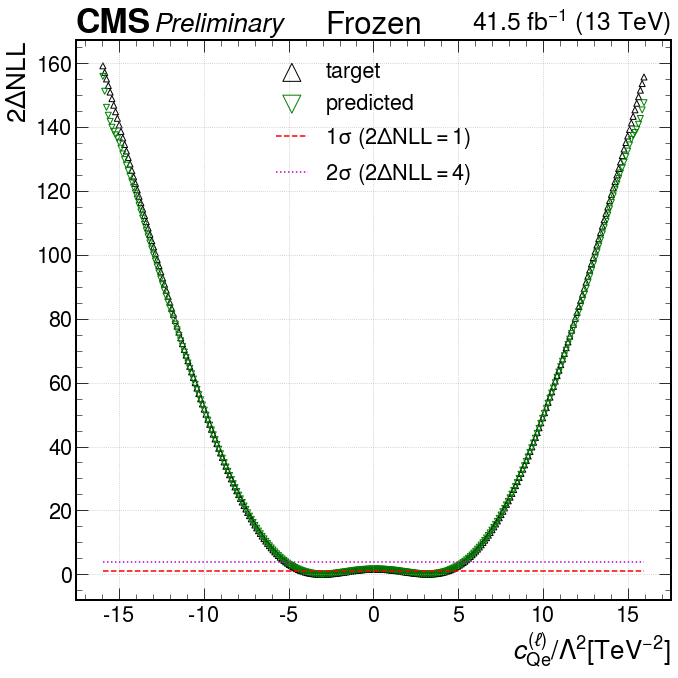

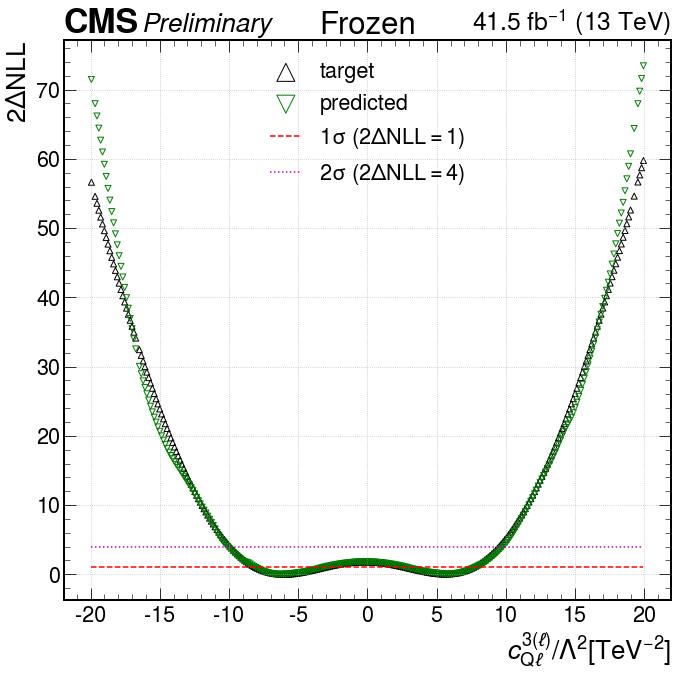

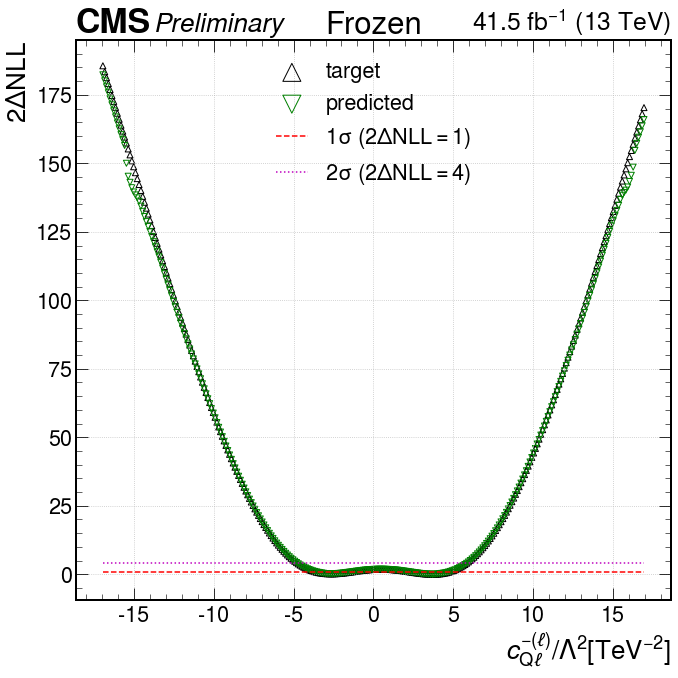

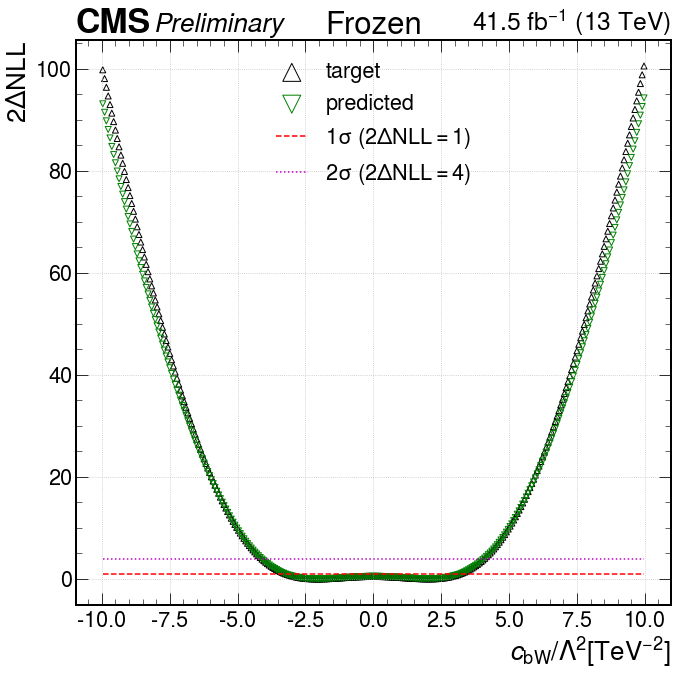

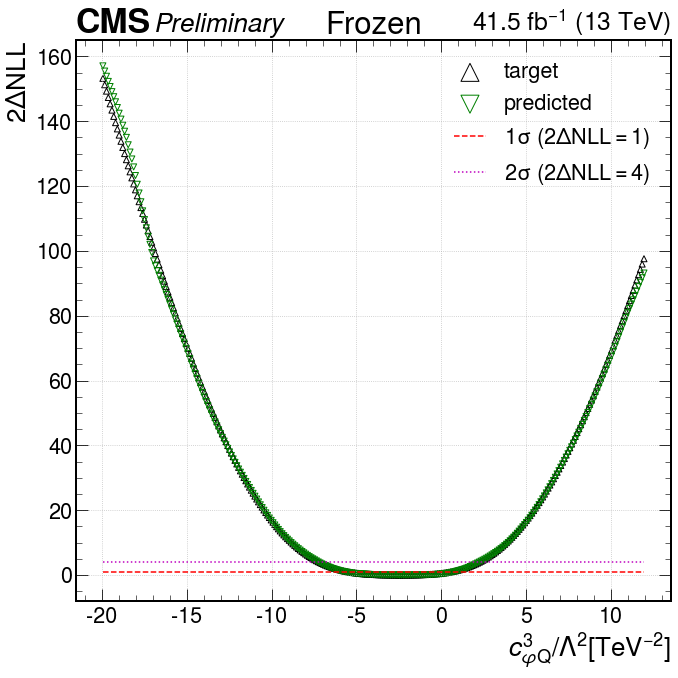

...

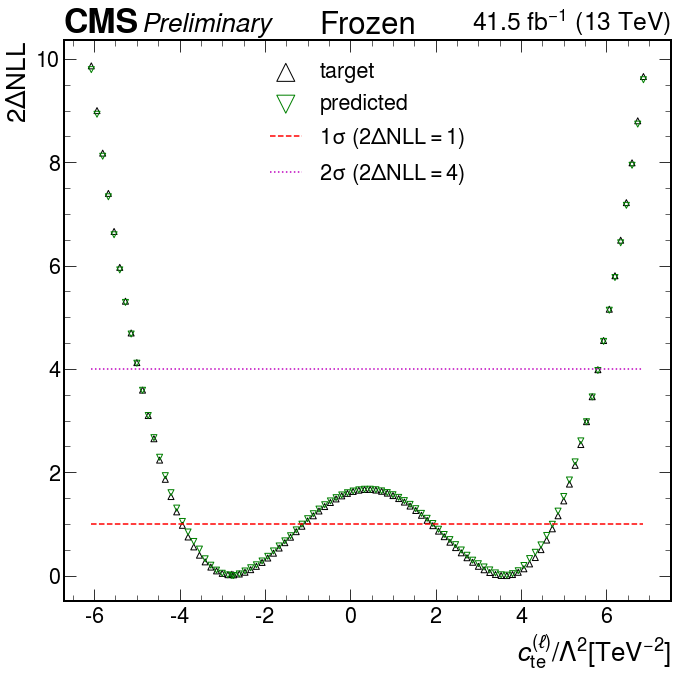

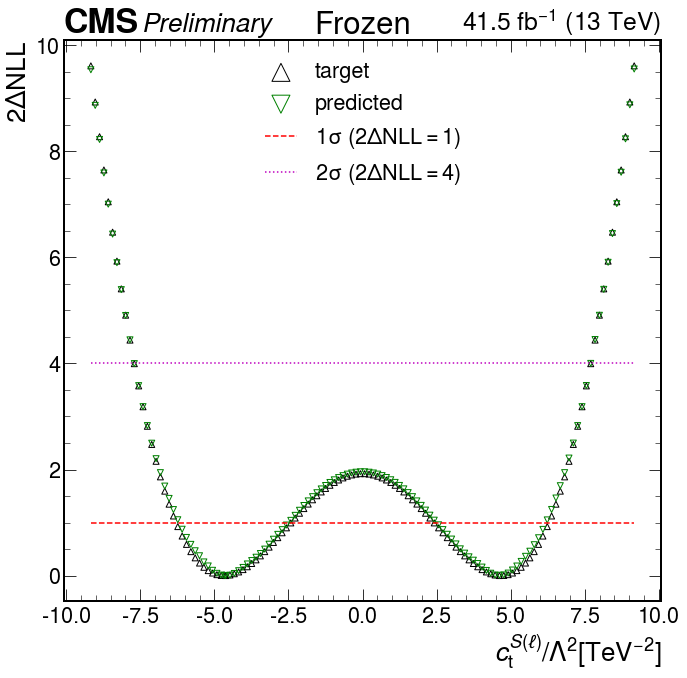

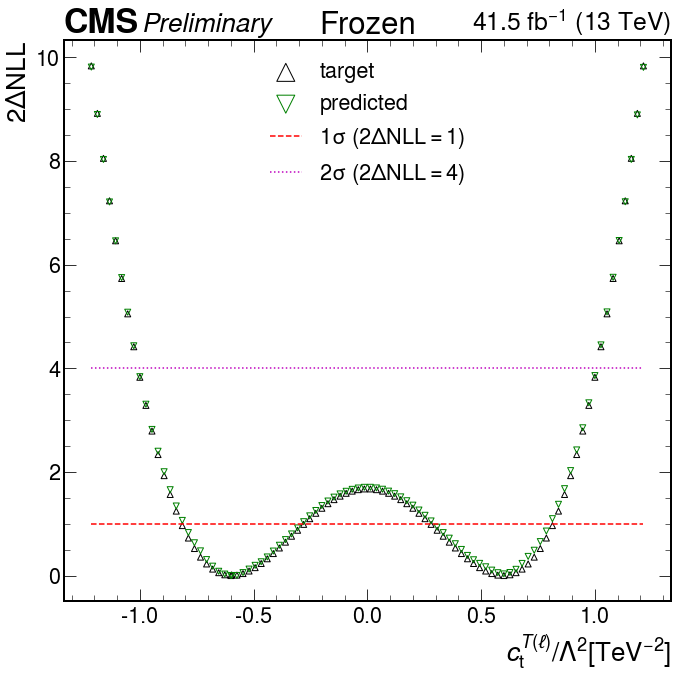

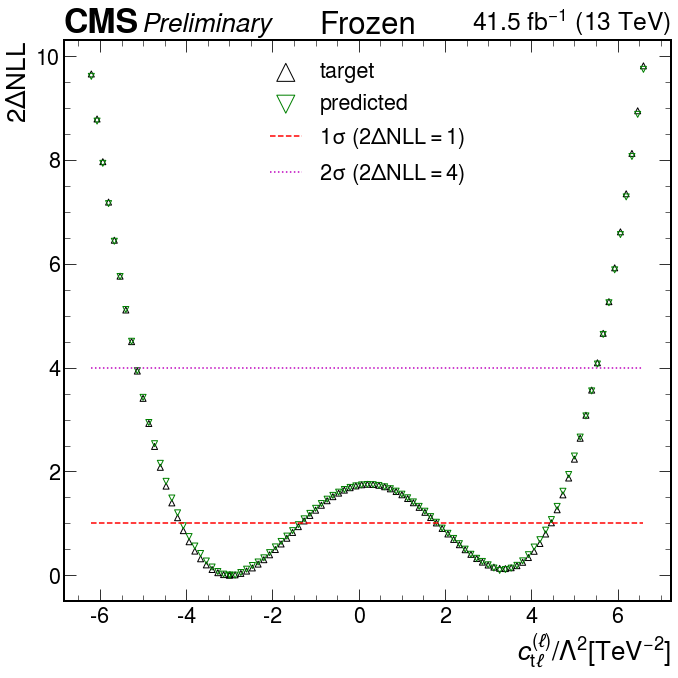

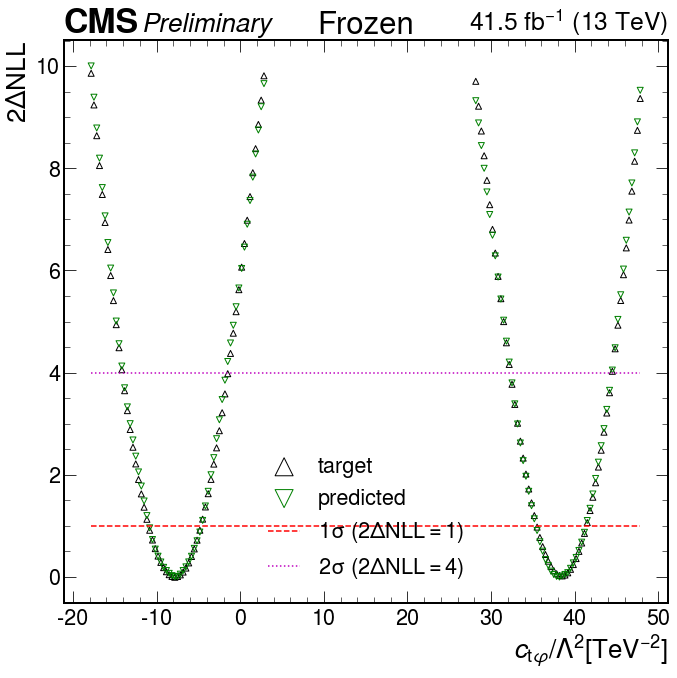

In [26]:
# Then make the graphs
frozen_1d_graphs = {}
for key in names.keys():
    target_1d_frozen_data[key]['2dNLL'] -= target_1d_frozen_data[key]['2dNLL'].min()
    model_1d_frozen_data[key]['2dNLL'] -= model_1d_frozen_data[key]['2dNLL'].min()
    frozen_1d_graphs[key] = plt.subplots()
    hep.cms.label('Preliminary', data=True, lumi=41.5)
    target_scatter = frozen_1d_graphs[key][1].scatter(target_1d_frozen_data[key][key], target_1d_frozen_data[key]['2dNLL'], marker='^', c='none', ec='k')
    model_scatter = frozen_1d_graphs[key][1].scatter(model_1d_frozen_data[key][key], model_1d_frozen_data[key]['2dNLL'], marker='v', c='none', ec='g')
    one_line, = frozen_1d_graphs[key][1].plot([target_1d_frozen_data[key][key].min(), target_1d_frozen_data[key][key].max()], [1,1], 'r--')
    four_line, = frozen_1d_graphs[key][1].plot([target_1d_frozen_data[key][key].min(), target_1d_frozen_data[key][key].max()], [4,4], 'm:')
    frozen_1d_graphs[key][1].grid()
    frozen_1d_graphs[key][1].legend([target_scatter, model_scatter, one_line, four_line], ['target', 'predicted', '$1\sigma\ (2\Delta NLL=1)$', '$2\sigma\ (2\Delta NLL=4)$'], markerscale=3)
    frozen_1d_graphs[key][1].set_xlabel(labels[key])
    frozen_1d_graphs[key][1].set_ylabel('2$\Delta$NLL')
    frozen_1d_graphs[key][1].set_title('Frozen')
    frozen_1d_graphs[key][0].tight_layout()

'''
diff_frozen_1d_graphs = {}
for key in names.keys():
    diff_frozen_1d_graphs[key] = plt.subplots()
    diff_frozen_1d_graphs[key][1].scatter(diff_1d_frozen_data[key][key], diff_1d_frozen_data[key]['2dNLL'], c='b', s=1)
    diff_frozen_1d_graphs[key][1].set_xlabel(key)
    diff_frozen_1d_graphs[key][1].set_ylabel('residual (target - prediction)')
    diff_frozen_1d_graphs[key][1].set_title('Frozen')
    diff_frozen_1d_graphs[key][0].tight_layout()
'''
    
zoomed_frozen_1d_graphs = {}
for key in names.keys():
    target_1d_zoomed_frozen_data[key]['2dNLL'] -= target_1d_zoomed_frozen_data[key]['2dNLL'].min()
    model_1d_zoomed_frozen_data[key]['2dNLL'] -= model_1d_zoomed_frozen_data[key]['2dNLL'].min()
    zoomed_frozen_1d_graphs[key] = plt.subplots()
    hep.cms.label('Preliminary', data=True, lumi=41.5)
    target_scatter = zoomed_frozen_1d_graphs[key][1].scatter(target_1d_zoomed_frozen_data[key][key], target_1d_zoomed_frozen_data[key]['2dNLL'], marker='^', c='none', ec='k')
    model_scatter = zoomed_frozen_1d_graphs[key][1].scatter(model_1d_zoomed_frozen_data[key][key], model_1d_zoomed_frozen_data[key]['2dNLL'], marker='v', c='none', ec='g')
    one_line, = zoomed_frozen_1d_graphs[key][1].plot([target_1d_zoomed_frozen_data[key][key].min(), target_1d_zoomed_frozen_data[key][key].max()], [1,1], 'r--')
    four_line, = zoomed_frozen_1d_graphs[key][1].plot([target_1d_zoomed_frozen_data[key][key].min(), target_1d_zoomed_frozen_data[key][key].max()], [4,4], 'm:')
    zoomed_frozen_1d_graphs[key][1].legend([target_scatter, model_scatter, one_line, four_line], ['target', 'predicted', '$1\sigma\ (2\Delta NLL=1)$', '$2\sigma\ (2\Delta NLL=4)$'], markerscale=3)
    zoomed_frozen_1d_graphs[key][1].set_xlabel(labels[key])
    zoomed_frozen_1d_graphs[key][1].set_ylabel('2$\Delta$NLL')
    zoomed_frozen_1d_graphs[key][1].set_title('Frozen')
    zoomed_frozen_1d_graphs[key][0].tight_layout()

In [27]:
# Save the graphs
for key in frozen_1d_graphs.keys():
    pp.savefig(frozen_1d_graphs[key][0])
'''
for key in diff_frozen_1d_graphs.keys():
    pp.savefig(diff_frozen_1d_graphs[key][0])
'''
for key in zoomed_frozen_1d_graphs.keys():
    pp.savefig(zoomed_frozen_1d_graphs[key][0])

In [28]:
# TODO (WARNING): cpQ3, cpQM, ctG, cpt, ctW, ctZ have new data and it doesn't have the other WCs saved.
# So the fake profiled graphs don't work now.
# 1D fake profiled graphs compared to Combine scans
# Load data first
target_1d_fake_profiled_data = validation_data['target_1d_fake_profiled_data'].item()
model_1d_fake_profiled_data = validation_data['model_1d_fake_profiled_data'].item()
diff_1d_fake_profiled_data = validation_data['diff_1d_fake_profiled_data'].item()

target_1d_zoomed_fake_profiled_data = {}
for key in names.keys():
    less_than_10 = (target_1d_fake_profiled_data[key]['2dNLL'] < 10)
    target_1d_zoomed_fake_profiled_data[key] = {'all_WCs': target_1d_fake_profiled_data[key]['all_WCs'][less_than_10], '2dNLL': target_1d_fake_profiled_data[key]['2dNLL'][less_than_10]}
    
model_1d_zoomed_fake_profiled_data = {}
diff_1d_zoomed_fake_profiled_data = {}
for key in names.keys():
    less_than_10 = (target_1d_fake_profiled_data[key]['2dNLL'] < 10)
    model_1d_zoomed_fake_profiled_data[key] = {'all_WCs': model_1d_fake_profiled_data[key]['all_WCs'][less_than_10], '2dNLL': model_1d_fake_profiled_data[key]['2dNLL'][less_than_10]}
    diff_1d_zoomed_fake_profiled_data[key] = {'all_WCs': diff_1d_fake_profiled_data[key]['all_WCs'][less_than_10], '2dNLL': diff_1d_fake_profiled_data[key]['2dNLL'][less_than_10]}

/srv/ipykernel_22/3444950494.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  zoomed_fake_profiled_1d_graphs[key] = plt.subplots()


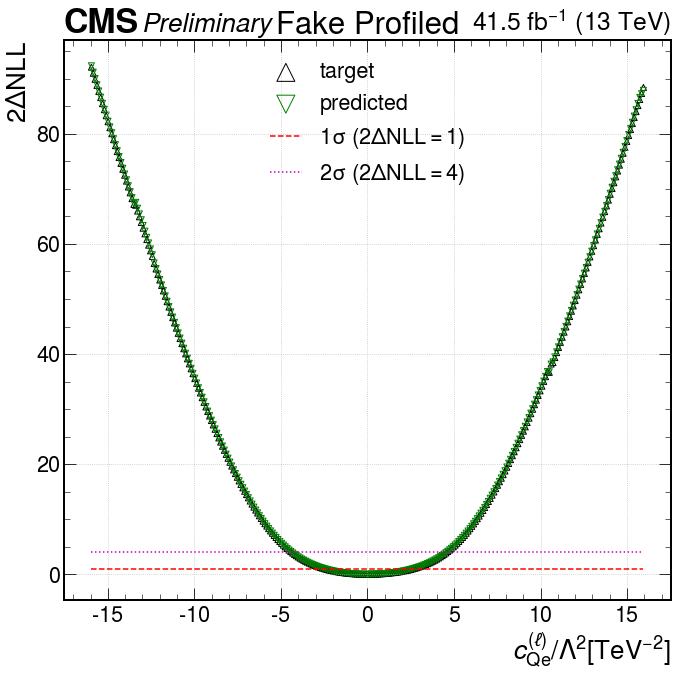

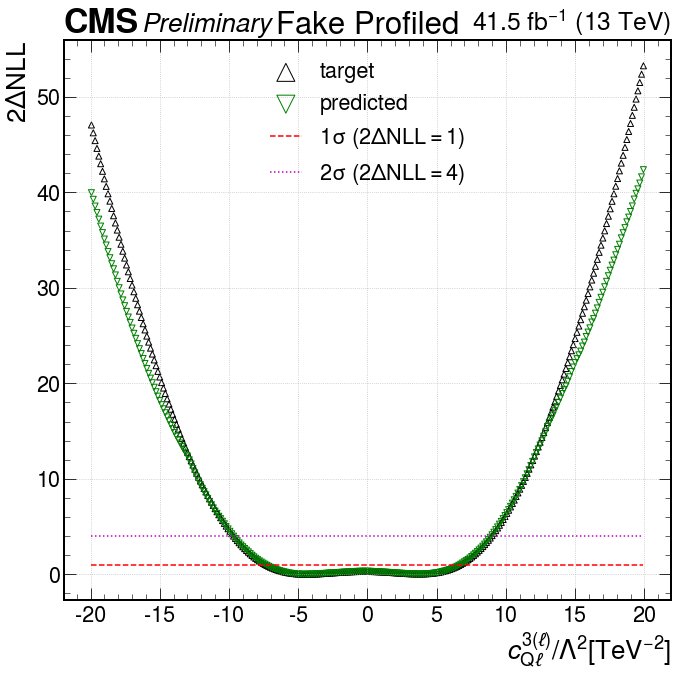

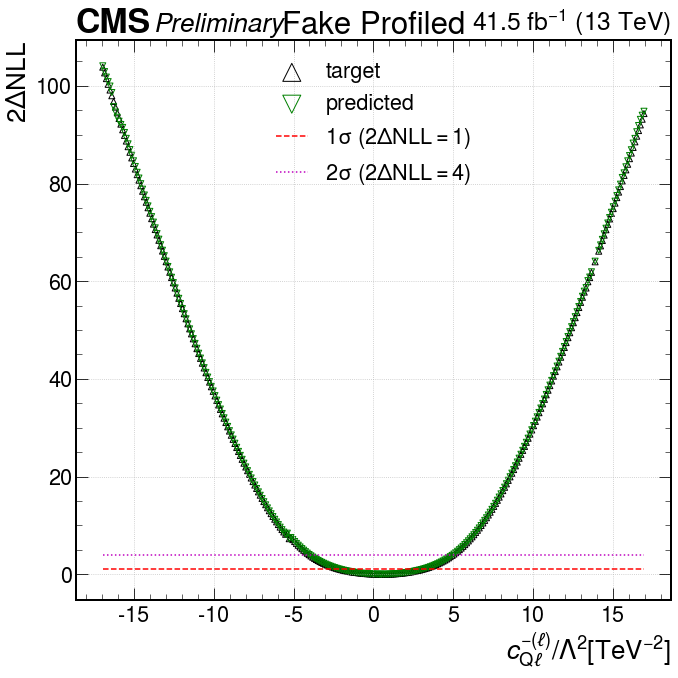

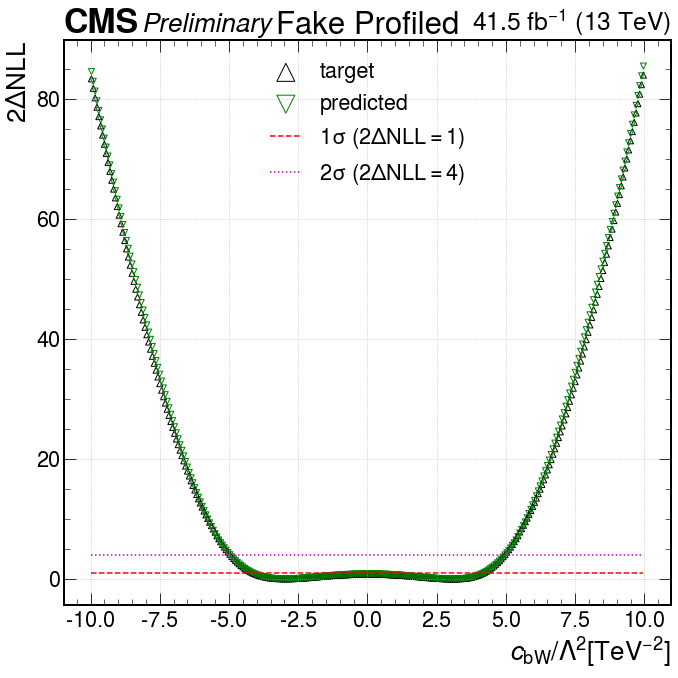

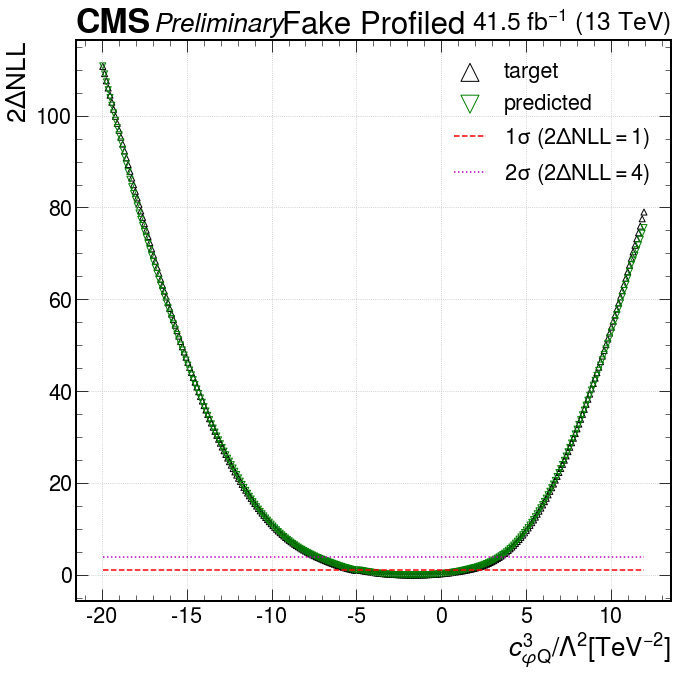

...

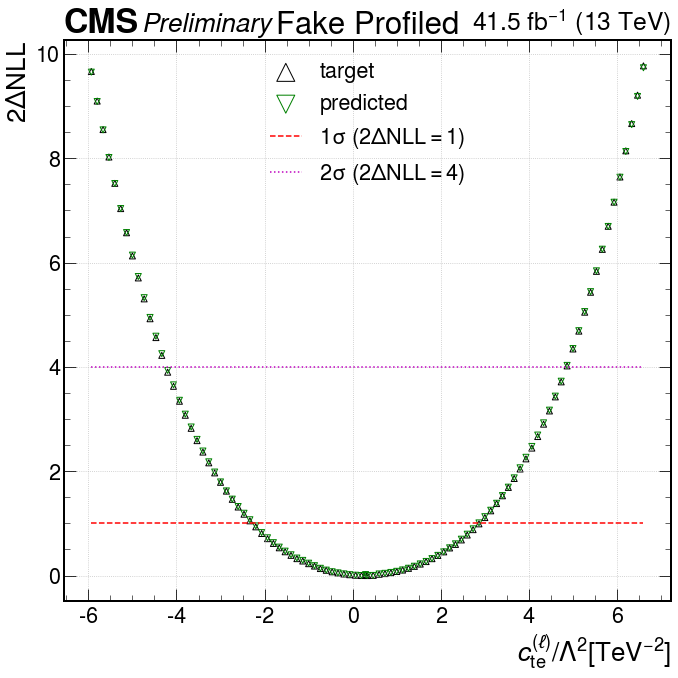

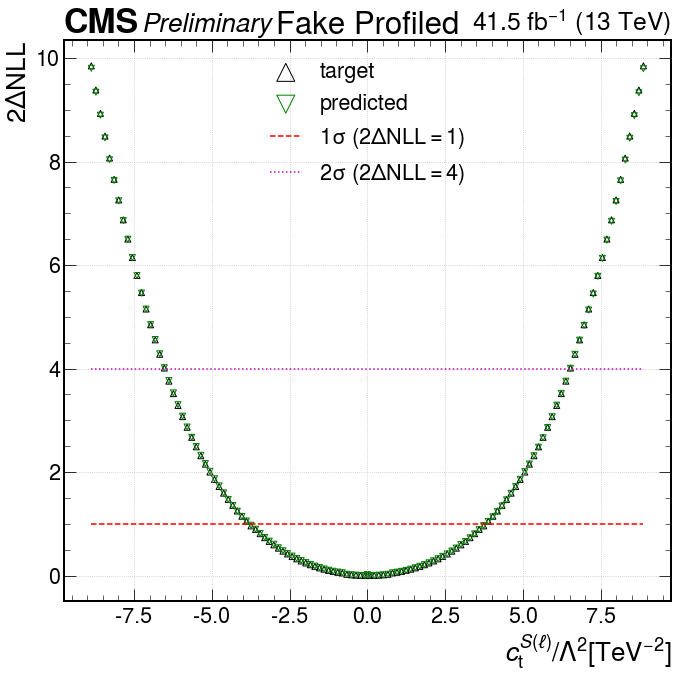

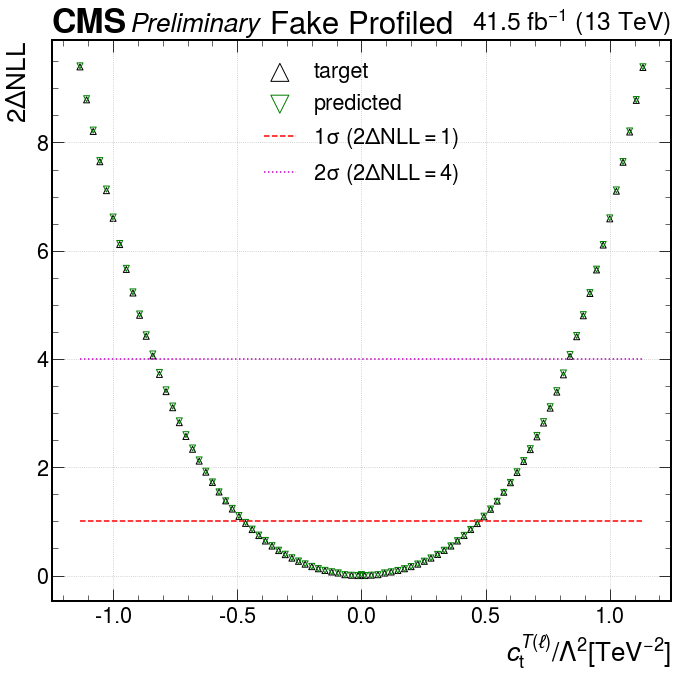

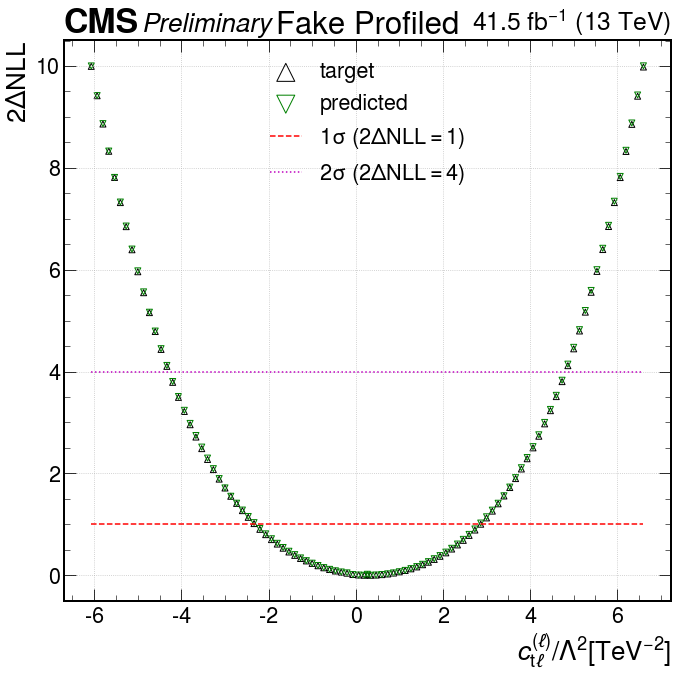

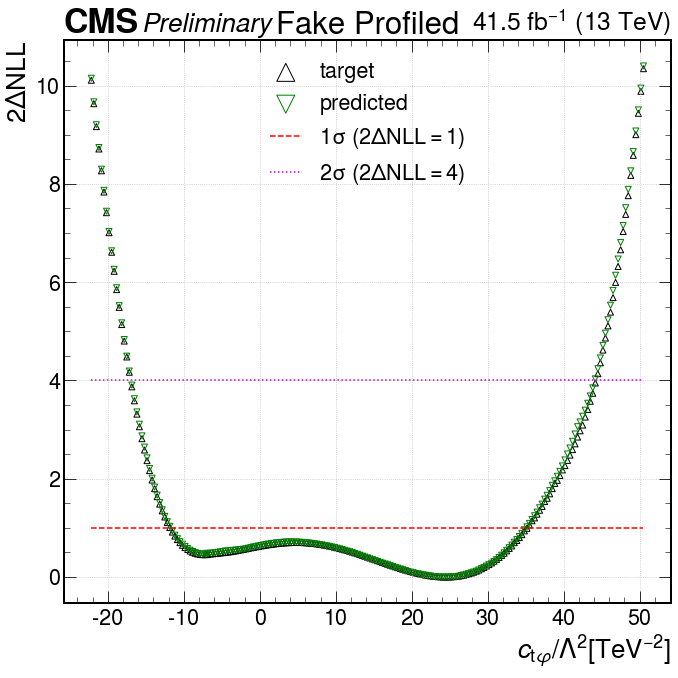

In [29]:
# Then make the graphs
# 1D fake profiled graphs compared to Combine scans
fake_profiled_1d_graphs = {}
for key in names.keys():
    target_1d_fake_profiled_data[key]['2dNLL'] -= target_1d_fake_profiled_data[key]['2dNLL'].min()
    model_1d_fake_profiled_data[key]['2dNLL'] -= model_1d_fake_profiled_data[key]['2dNLL'].min()
    fake_profiled_1d_graphs[key] = plt.subplots()
    hep.cms.label('Preliminary', data=True, lumi=41.5)
    target_scatter = fake_profiled_1d_graphs[key][1].scatter(target_1d_fake_profiled_data[key]['all_WCs'][:,names[key]], target_1d_fake_profiled_data[key]['2dNLL'], marker='^', c='none', ec='k')
    model_scatter = fake_profiled_1d_graphs[key][1].scatter(model_1d_fake_profiled_data[key]['all_WCs'][:,names[key]], model_1d_fake_profiled_data[key]['2dNLL'], marker='v', c='none', ec='g')
    one_line, = fake_profiled_1d_graphs[key][1].plot([target_1d_fake_profiled_data[key]['all_WCs'][:,names[key]].min(), target_1d_fake_profiled_data[key]['all_WCs'][:,names[key]].max()], [1,1], 'r--')
    four_line, = fake_profiled_1d_graphs[key][1].plot([target_1d_fake_profiled_data[key]['all_WCs'][:,names[key]].min(), target_1d_fake_profiled_data[key]['all_WCs'][:,names[key]].max()], [4,4], 'm:')
    fake_profiled_1d_graphs[key][1].grid()
    fake_profiled_1d_graphs[key][1].legend([target_scatter, model_scatter, one_line, four_line], ['target', 'predicted', '$1\sigma\ (2\Delta NLL=1)$', '$2\sigma\ (2\Delta NLL=4)$'], markerscale=3)
    fake_profiled_1d_graphs[key][1].set_xlabel(labels[key])
    fake_profiled_1d_graphs[key][1].set_ylabel('2$\Delta$NLL')
    fake_profiled_1d_graphs[key][1].set_title('Fake Profiled')
    fake_profiled_1d_graphs[key][0].tight_layout()

zoomed_fake_profiled_1d_graphs = {}
for key in names.keys():
    target_1d_zoomed_fake_profiled_data[key]['2dNLL'] -= target_1d_zoomed_fake_profiled_data[key]['2dNLL'].min()
    model_1d_zoomed_fake_profiled_data[key]['2dNLL'] -= model_1d_zoomed_fake_profiled_data[key]['2dNLL'].min()
    zoomed_fake_profiled_1d_graphs[key] = plt.subplots()
    hep.cms.label('Preliminary', data=True, lumi=41.5)
    target_scatter = zoomed_fake_profiled_1d_graphs[key][1].scatter(target_1d_zoomed_fake_profiled_data[key]['all_WCs'][:,names[key]], target_1d_zoomed_fake_profiled_data[key]['2dNLL'], marker='^', c='none', ec='k')
    model_scatter = zoomed_fake_profiled_1d_graphs[key][1].scatter(model_1d_zoomed_fake_profiled_data[key]['all_WCs'][:,names[key]], model_1d_zoomed_fake_profiled_data[key]['2dNLL'], marker='v', c='none', ec='g')
    one_line, = zoomed_fake_profiled_1d_graphs[key][1].plot([target_1d_zoomed_fake_profiled_data[key]['all_WCs'][:,names[key]].min(), target_1d_zoomed_fake_profiled_data[key]['all_WCs'][:,names[key]].max()], [1,1], 'r--')
    four_line, = zoomed_fake_profiled_1d_graphs[key][1].plot([target_1d_zoomed_fake_profiled_data[key]['all_WCs'][:,names[key]].min(), target_1d_zoomed_fake_profiled_data[key]['all_WCs'][:,names[key]].max()], [4,4], 'm:')
    zoomed_fake_profiled_1d_graphs[key][1].grid()
    zoomed_fake_profiled_1d_graphs[key][1].legend([target_scatter, model_scatter, one_line, four_line], ['target', 'predicted', '$1\sigma\ (2\Delta NLL=1)$', '$2\sigma\ (2\Delta NLL=4)$'], markerscale=3)
    zoomed_fake_profiled_1d_graphs[key][1].set_xlabel(labels[key])
    zoomed_fake_profiled_1d_graphs[key][1].set_ylabel('2$\Delta$NLL')
    zoomed_fake_profiled_1d_graphs[key][1].set_title('Fake Profiled')
    zoomed_fake_profiled_1d_graphs[key][0].tight_layout()

In [30]:
# Save the graphs
for key in fake_profiled_1d_graphs.keys():
    pp.savefig(fake_profiled_1d_graphs[key][0])
for key in zoomed_fake_profiled_1d_graphs.keys():
    pp.savefig(zoomed_fake_profiled_1d_graphs[key][0])

In [31]:
# 2D frozen graphs compared to Combine scans
# Load data first
target_2d_frozen_data = validation_data['target_2d_frozen_data'].item()
model_2d_frozen_data = validation_data['model_2d_frozen_data'].item()
diff_2d_frozen_data = validation_data['diff_2d_frozen_data'].item()

"\ndiff_frozen_2d_graphs = {}\nfor num in np.arange(8):\n    diff_frozen_2d_graphs[str(num)] = plt.subplots()\n    im = diff_frozen_2d_graphs[str(num)][1].tripcolor(diff_2d_frozen_data[str(num)][WC2d_2[num]], diff_2d_frozen_data[str(num)][WC2d_1[num]], diff_2d_frozen_data[str(num)]['2dNLL'])\n    diff_frozen_2d_graphs[str(num)][1].set_xlabel(WC2d_2[num])\n    diff_frozen_2d_graphs[str(num)][1].set_ylabel(WC2d_1[num])\n    diff_frozen_2d_graphs[str(num)][1].set_title('Frozen')\n    diff_frozen_2d_graphs[str(num)][0].colorbar(im, ax=diff_frozen_2d_graphs[str(num)][1], label='target - prediction')\n    diff_frozen_2d_graphs[str(num)][0].tight_layout()\n"

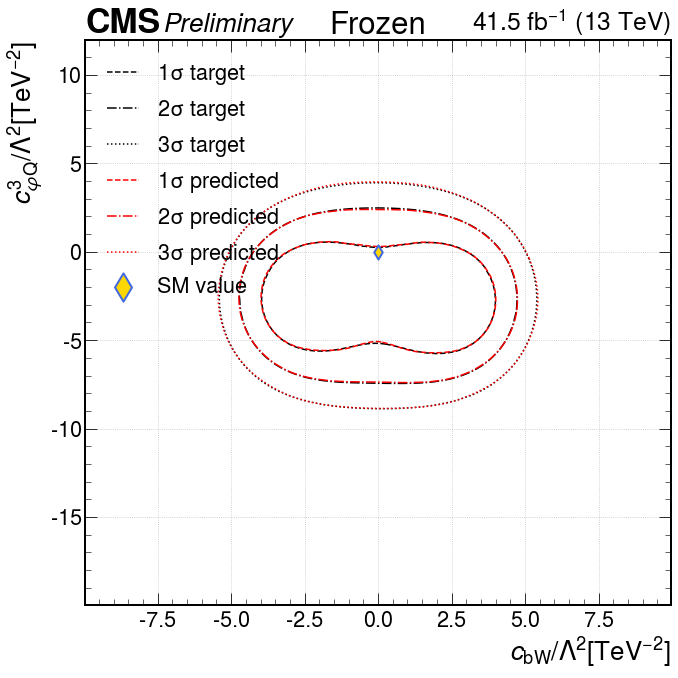

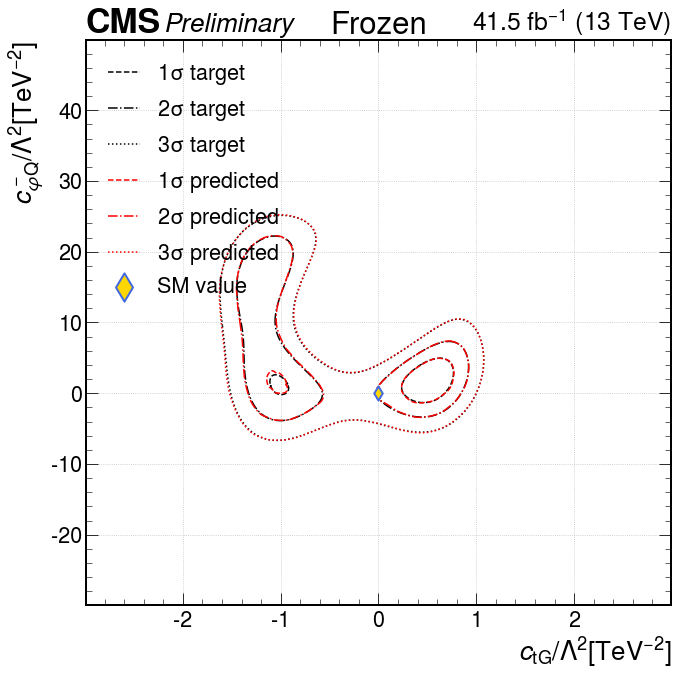

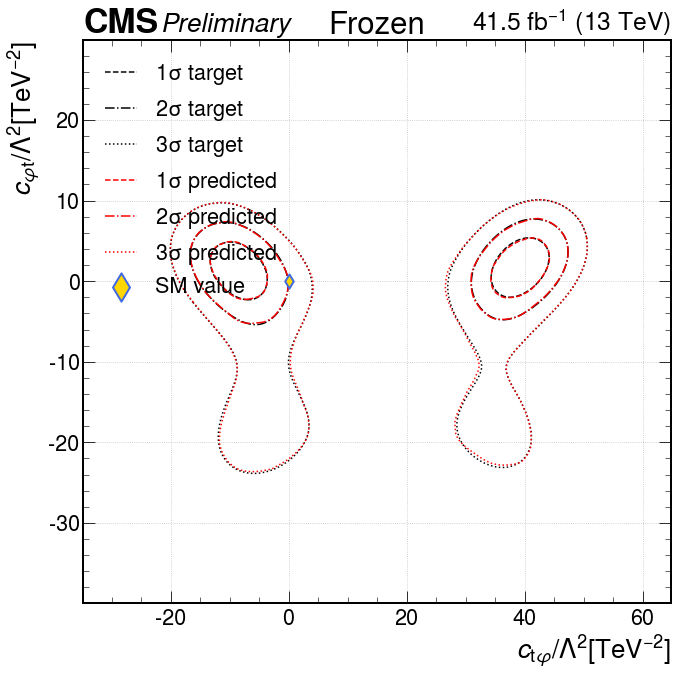

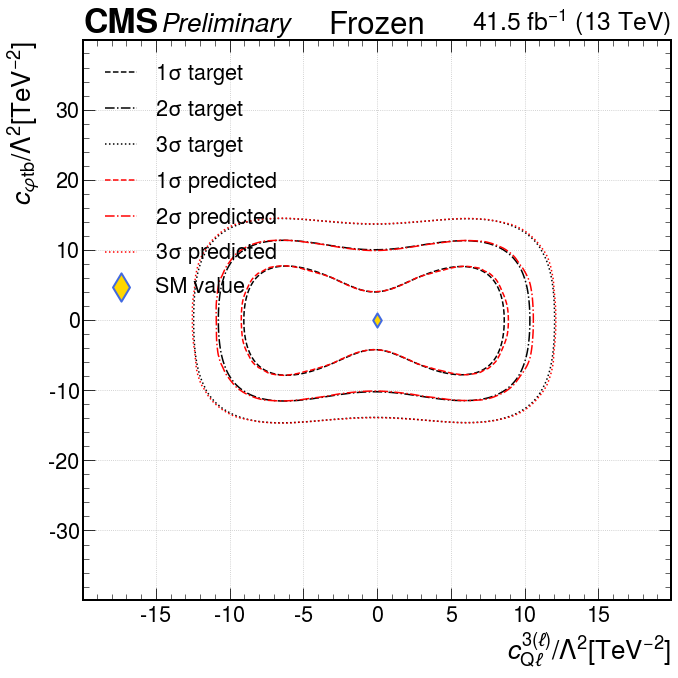

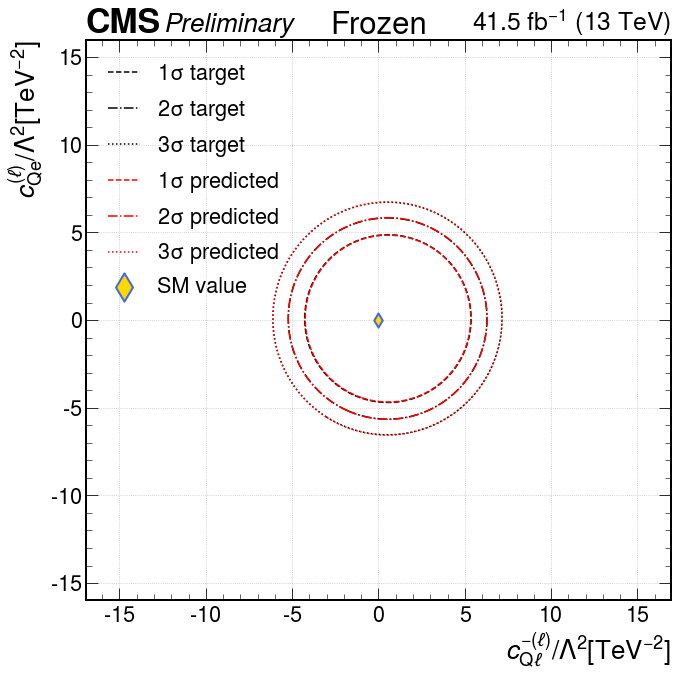

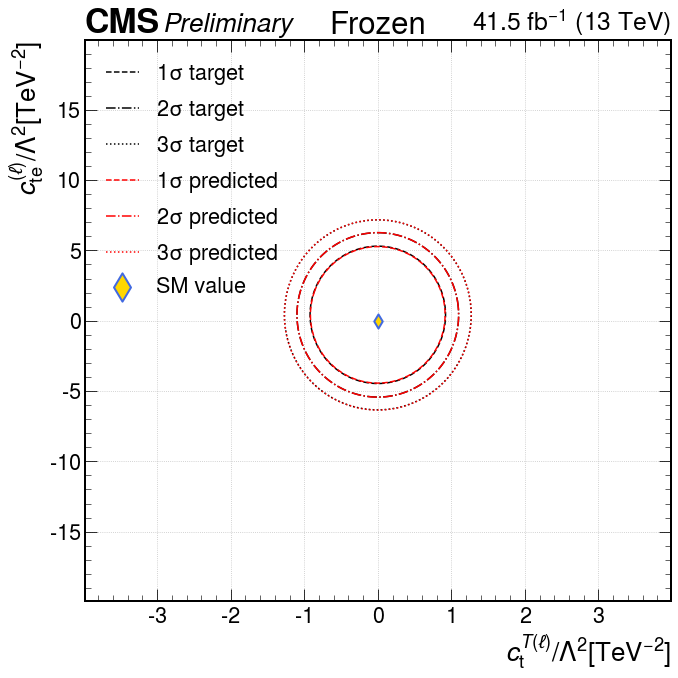

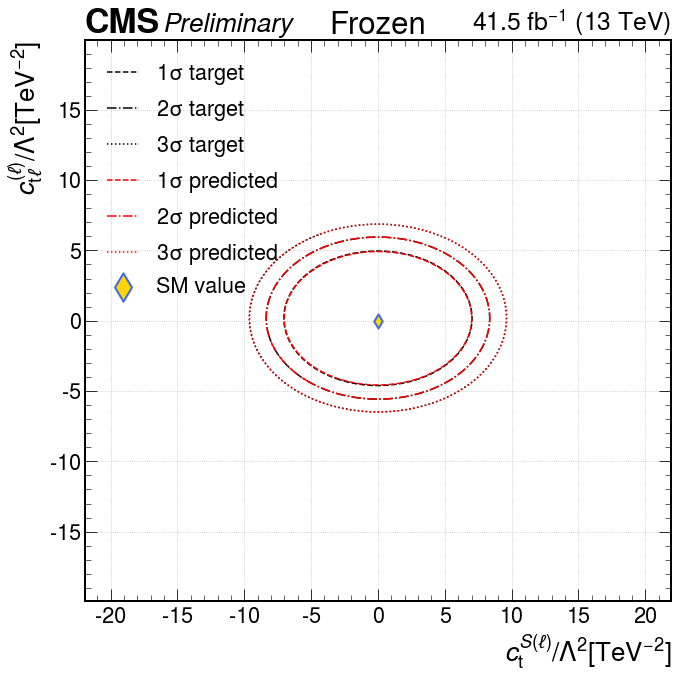

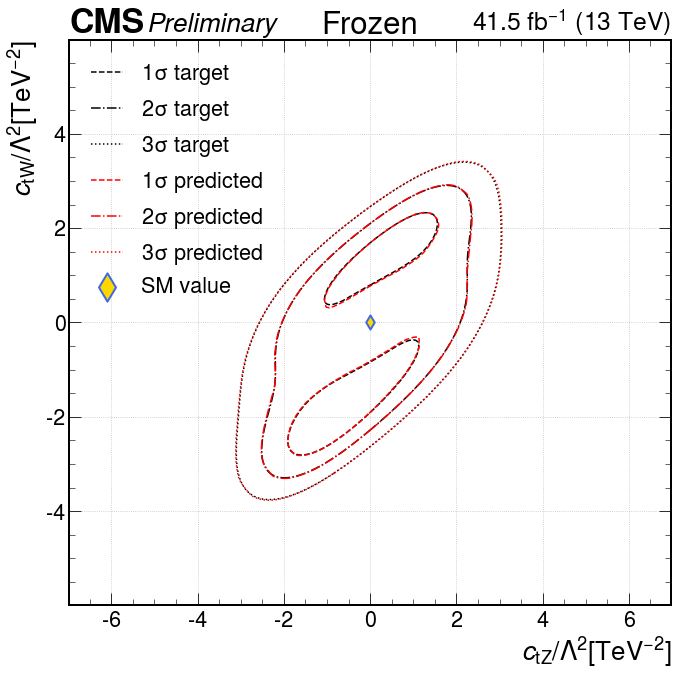

In [32]:
# Then make the graphs
# 2D frozen graphs compared to Combine scans
frozen_2d_graphs = {}
for num in np.arange(8):
    target_2d_frozen_data[str(num)]['2dNLL'] -= target_2d_frozen_data[str(num)]['2dNLL'].min()
    model_2d_frozen_data[str(num)]['2dNLL'] -= model_2d_frozen_data[str(num)]['2dNLL'].min()
    frozen_2d_graphs[str(num)] = plt.subplots()
    hep.cms.label('Preliminary', data=True, lumi=41.5)
    target_contour = frozen_2d_graphs[str(num)][1].tricontour(target_2d_frozen_data[str(num)][WC2d_2[num]], target_2d_frozen_data[str(num)][WC2d_1[num]], target_2d_frozen_data[str(num)]['2dNLL'], colors='k', linestyles=['dashed', 'dashdot', 'dotted'], levels=[2.30, 6.18, 11.83]) # 1, 2, and 3 sigmas
    model_contour = frozen_2d_graphs[str(num)][1].tricontour(model_2d_frozen_data[str(num)][WC2d_2[num]], model_2d_frozen_data[str(num)][WC2d_1[num]], model_2d_frozen_data[str(num)]['2dNLL'], colors='r', linestyles=['dashed', 'dashdot', 'dotted'], levels=[2.30, 6.18, 11.83]) # 1, 2, and 3 sigmas
    SM_value = frozen_2d_graphs[str(num)][1].scatter(0, 0, marker='d', c='gold', ec='royalblue', s=100, linewidths=2, zorder=10)
    frozen_2d_graphs[str(num)][1].grid()
    frozen_2d_graphs[str(num)][1].legend(target_contour.collections+model_contour.collections+[SM_value], ['$1\sigma$ target', '$2\sigma$ target', '$3\sigma$ target', '$1\sigma$ predicted', '$2\sigma$ predicted', '$3\sigma$ predicted', 'SM value'], loc='upper left', markerscale=2)
    frozen_2d_graphs[str(num)][1].set_xlabel(labels[WC2d_2[num]])
    frozen_2d_graphs[str(num)][1].set_ylabel(labels[WC2d_1[num]])
    frozen_2d_graphs[str(num)][1].set_title('Frozen')
    frozen_2d_graphs[str(num)][0].tight_layout()
    #frozen_2d_graphs[str(num)][0].subplots_adjust(right=1.3)

'''
diff_frozen_2d_graphs = {}
for num in np.arange(8):
    diff_frozen_2d_graphs[str(num)] = plt.subplots()
    im = diff_frozen_2d_graphs[str(num)][1].tripcolor(diff_2d_frozen_data[str(num)][WC2d_2[num]], diff_2d_frozen_data[str(num)][WC2d_1[num]], diff_2d_frozen_data[str(num)]['2dNLL'])
    diff_frozen_2d_graphs[str(num)][1].set_xlabel(WC2d_2[num])
    diff_frozen_2d_graphs[str(num)][1].set_ylabel(WC2d_1[num])
    diff_frozen_2d_graphs[str(num)][1].set_title('Frozen')
    diff_frozen_2d_graphs[str(num)][0].colorbar(im, ax=diff_frozen_2d_graphs[str(num)][1], label='target - prediction')
    diff_frozen_2d_graphs[str(num)][0].tight_layout()
'''

In [33]:
# Save the graphs
for key in frozen_2d_graphs.keys():
    pp.savefig(frozen_2d_graphs[key][0])
'''
for key in diff_frozen_2d_graphs.keys():
    pp.savefig(diff_frozen_2d_graphs[key][0])
'''

'\nfor key in diff_frozen_2d_graphs.keys():\n    pp.savefig(diff_frozen_2d_graphs[key][0])\n'

In [34]:
# 2D fake profiled graphs compared to Combine scans
# Load data first
target_2d_profiled_data = validation_data['target_2d_profiled_data'].item()
model_2d_fake_profiled_data = validation_data['model_2d_fake_profiled_data'].item()

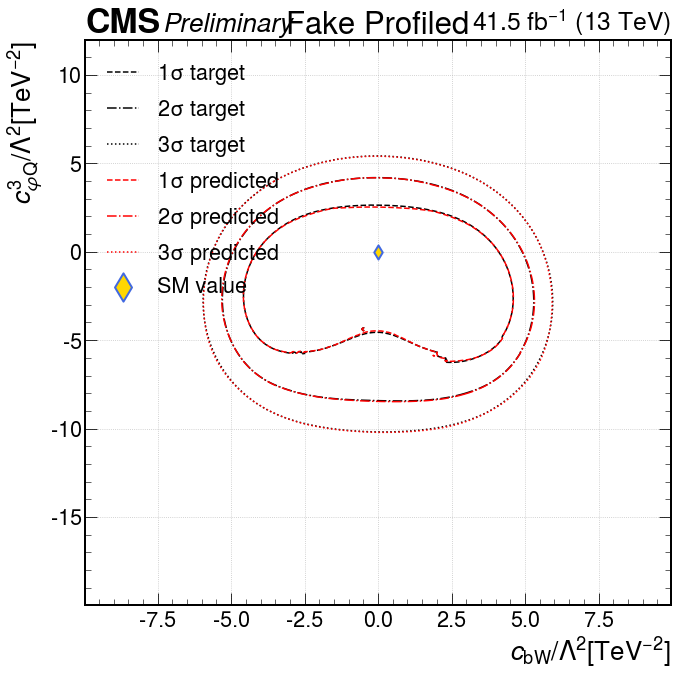

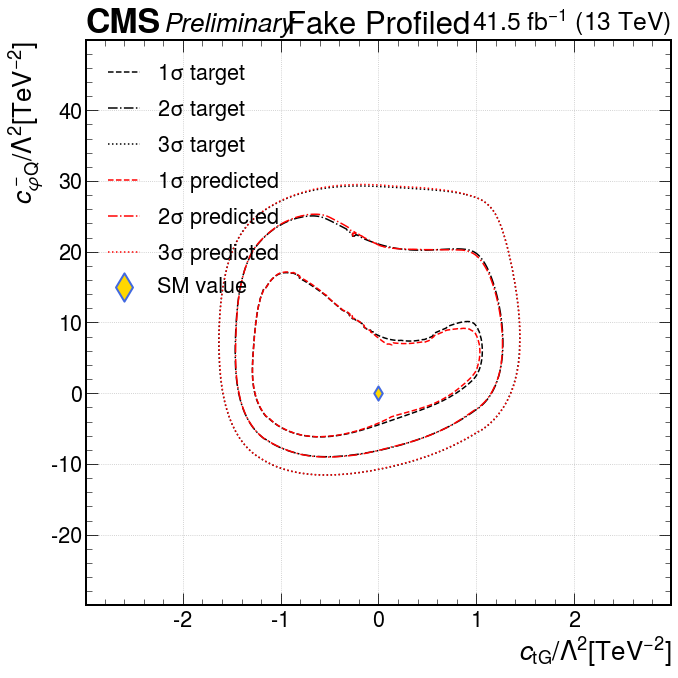

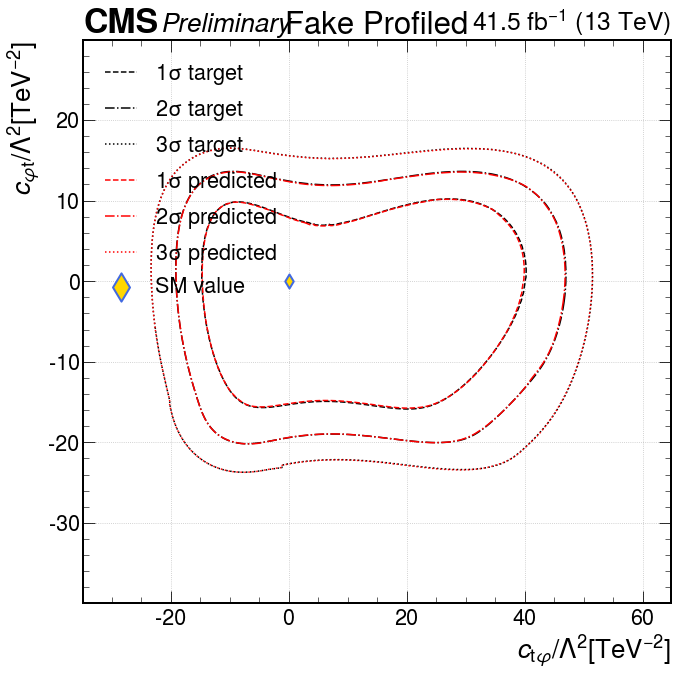

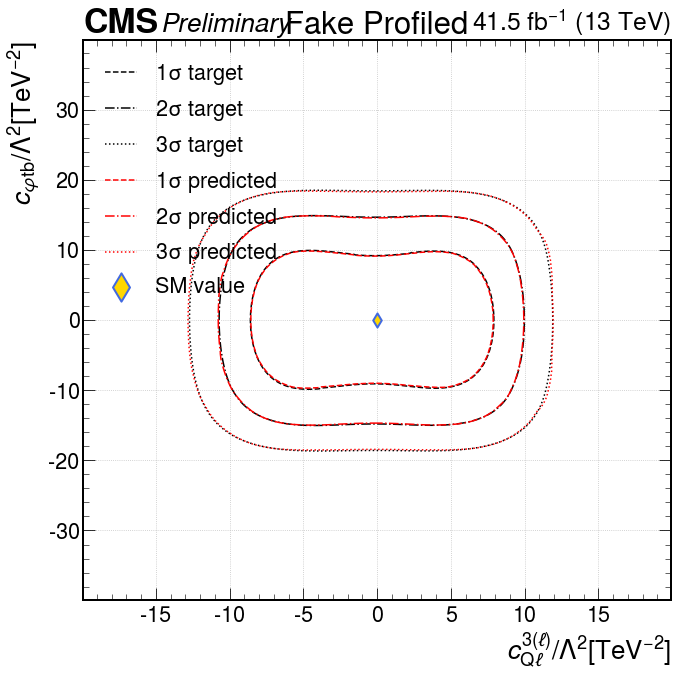

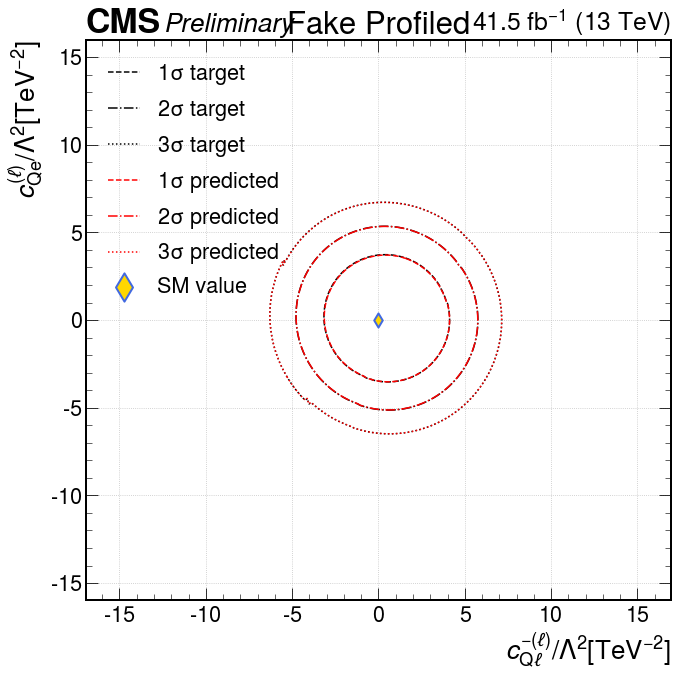

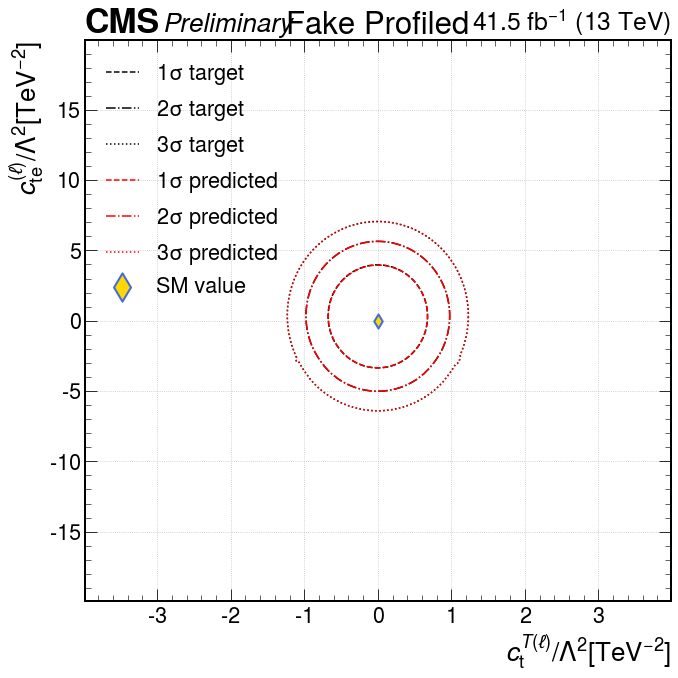

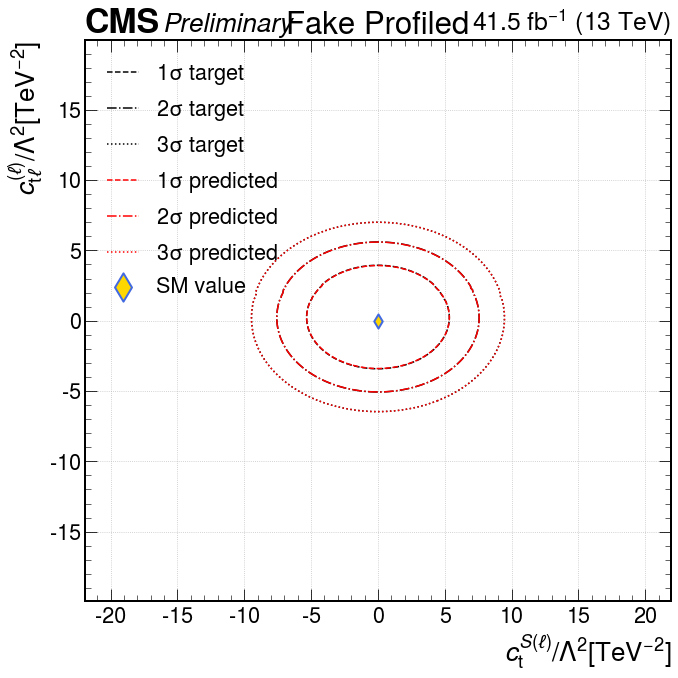

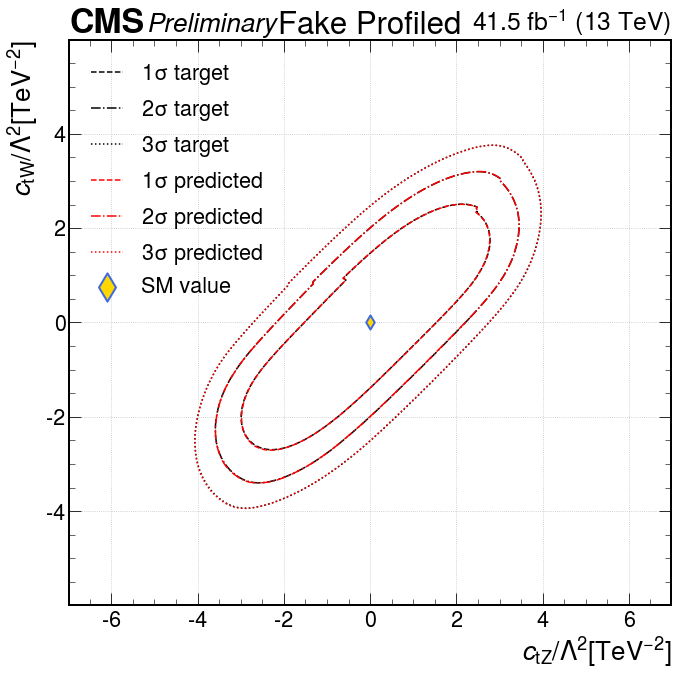

In [35]:
# Then make the graphs
fake_profiled_2d_graphs = {}
for num in np.arange(8):
    target_2d_profiled_data[str(num)]['2dNLL'] -= target_2d_profiled_data[str(num)]['2dNLL'].min()
    model_2d_fake_profiled_data[str(num)]['2dNLL'] -= model_2d_fake_profiled_data[str(num)]['2dNLL'].min()
    fake_profiled_2d_graphs[str(num)] = plt.subplots()
    hep.cms.label('Preliminary', data=True, lumi=41.5)
    target_contour = fake_profiled_2d_graphs[str(num)][1].tricontour(target_2d_profiled_data[str(num)]['all_WCs'][:, names[WC2d_2[num]]], target_2d_profiled_data[str(num)]['all_WCs'][:, names[WC2d_1[num]]], target_2d_profiled_data[str(num)]['2dNLL'], colors='k', linestyles=['dashed', 'dashdot', 'dotted'], levels=[2.30, 6.18, 11.83]) # 1, 2, and 3 sigmas
    model_contour = fake_profiled_2d_graphs[str(num)][1].tricontour(model_2d_fake_profiled_data[str(num)]['all_WCs'][:, names[WC2d_2[num]]], model_2d_fake_profiled_data[str(num)]['all_WCs'][:, names[WC2d_1[num]]], model_2d_fake_profiled_data[str(num)]['2dNLL'], colors='r', linestyles=['dashed', 'dashdot', 'dotted'], levels=[2.30, 6.18, 11.83]) # 1, 2, and 3 sigmas
    SM_value = fake_profiled_2d_graphs[str(num)][1].scatter(0, 0, marker='d', c='gold', ec='royalblue', s=100, linewidths=2, zorder=10)
    fake_profiled_2d_graphs[str(num)][1].grid()
    fake_profiled_2d_graphs[str(num)][1].legend(target_contour.collections+model_contour.collections+[SM_value], ['$1\sigma$ target', '$2\sigma$ target', '$3\sigma$ target', '$1\sigma$ predicted', '$2\sigma$ predicted', '$3\sigma$ predicted', 'SM value'], loc='upper left', markerscale=2)
    fake_profiled_2d_graphs[str(num)][1].set_xlabel(labels[WC2d_2[num]])
    fake_profiled_2d_graphs[str(num)][1].set_ylabel(labels[WC2d_1[num]])
    fake_profiled_2d_graphs[str(num)][1].set_title('Fake Profiled')
    fake_profiled_2d_graphs[str(num)][0].tight_layout()

In [36]:
# Save the graphs
for key in fake_profiled_2d_graphs.keys():
    pp.savefig(fake_profiled_2d_graphs[key][0])

In [37]:
# 1D real profiled graphs compared to Combine scans
# For target data see before
# Load data first
target_1d_profiled_data = validation_data['target_1d_profiled_data'].item()
model_1d_profiled_data = validation_data['model_1d_profiled_data'].item()
diff_1d_profiled_data = validation_data['diff_1d_profiled_data'].item()

target_1d_zoomed_profiled_data = {}
model_1d_zoomed_profiled_data = {}
diff_1d_zoomed_profiled_data = {}
for key in names.keys():
    less_than_10 = (target_1d_profiled_data[key]['2dNLL'] < 10)
    target_1d_zoomed_profiled_data[key] = {key: target_1d_profiled_data[key][key][less_than_10], '2dNLL': target_1d_profiled_data[key]['2dNLL'][less_than_10]}
    model_1d_zoomed_profiled_data[key] = {'all_WCs': model_1d_profiled_data[key]['all_WCs'][less_than_10], '2dNLL': model_1d_profiled_data[key]['2dNLL'][less_than_10]}
    diff_1d_zoomed_profiled_data[key] = {'all_WCs': diff_1d_profiled_data[key]['all_WCs'][less_than_10], '2dNLL': diff_1d_profiled_data[key]['2dNLL'][less_than_10]}

/srv/ipykernel_22/4156937362.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  zoomed_profiled_1d_graphs[key] = plt.subplots()


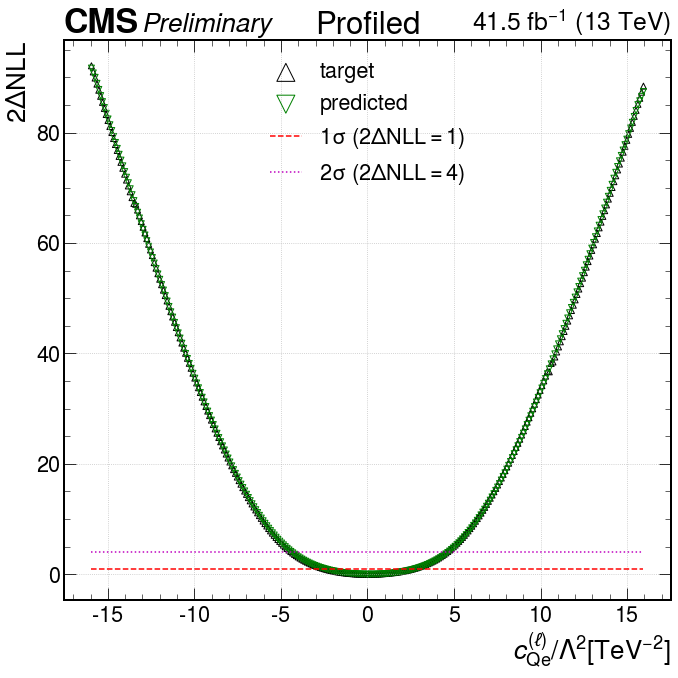

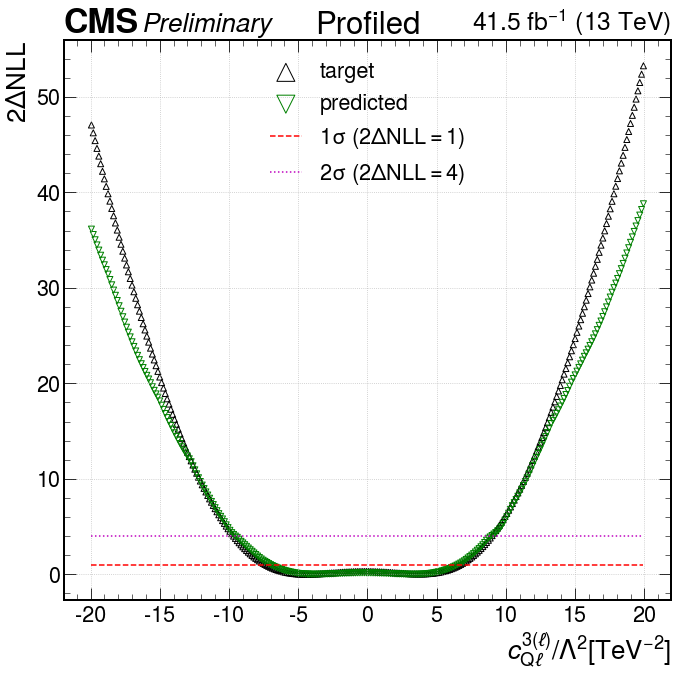

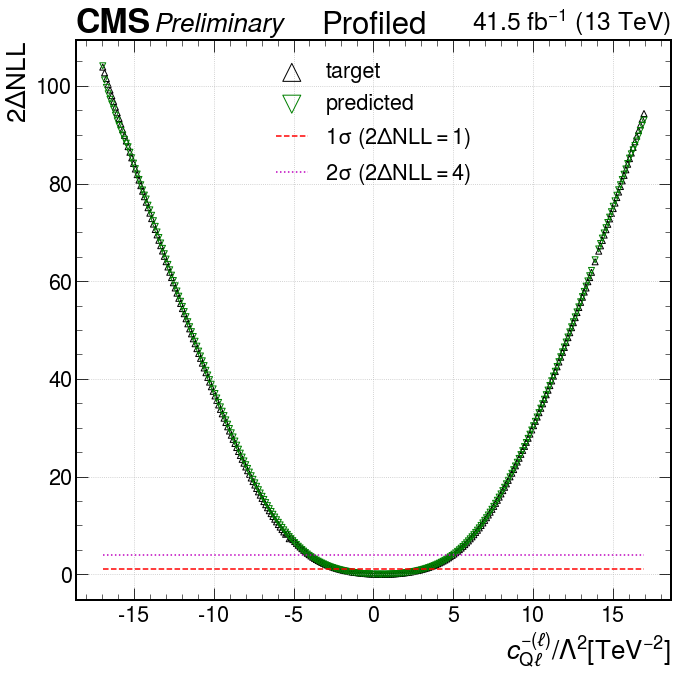

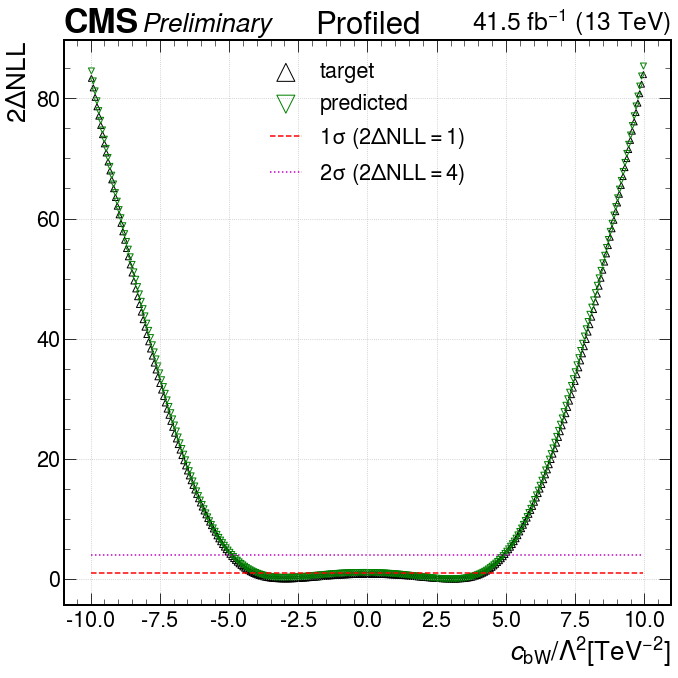

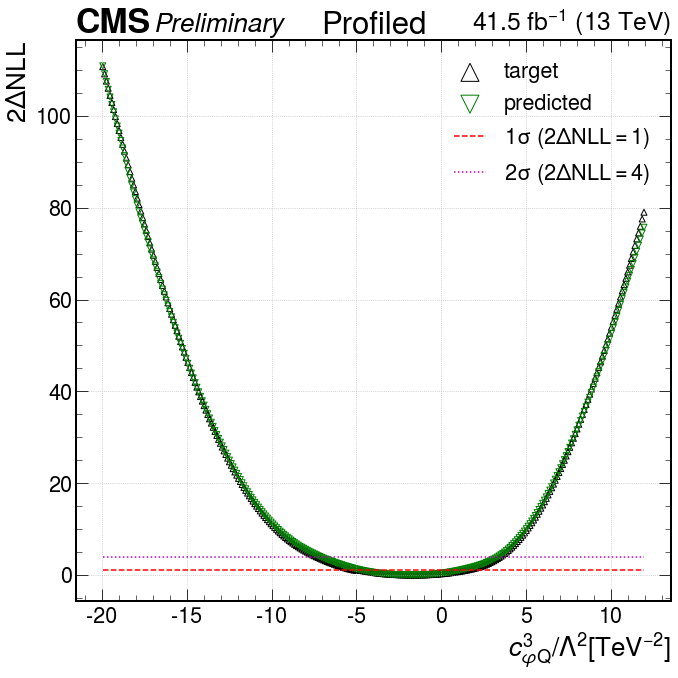

...

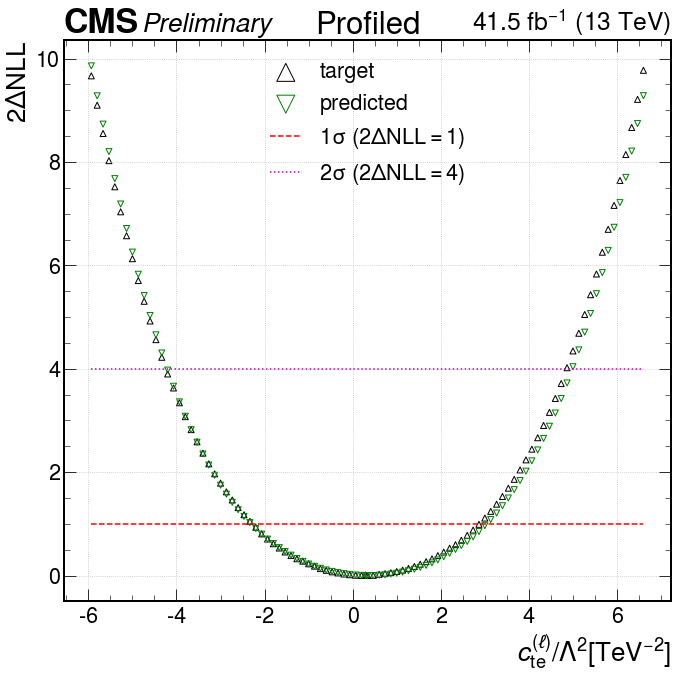

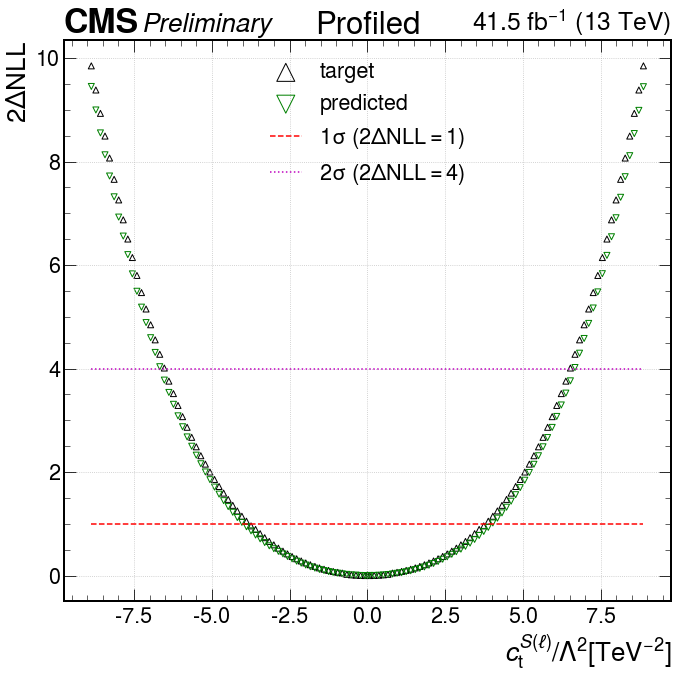

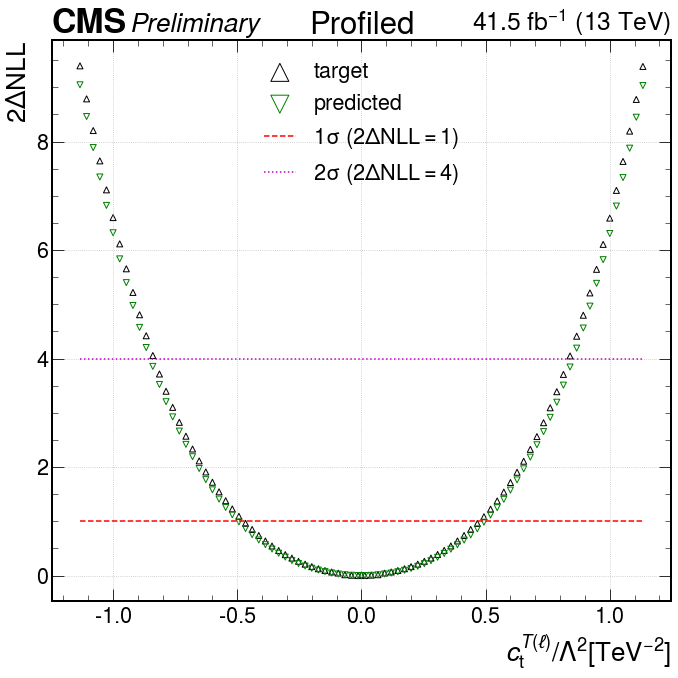

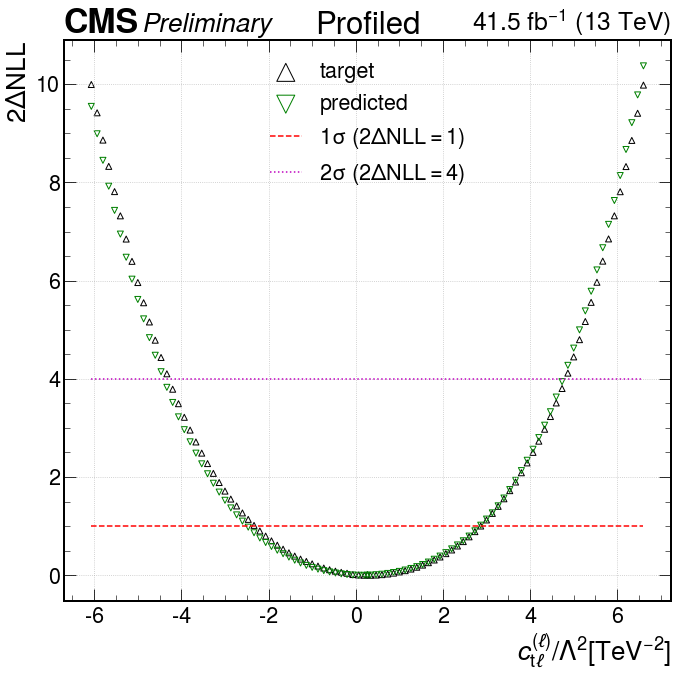

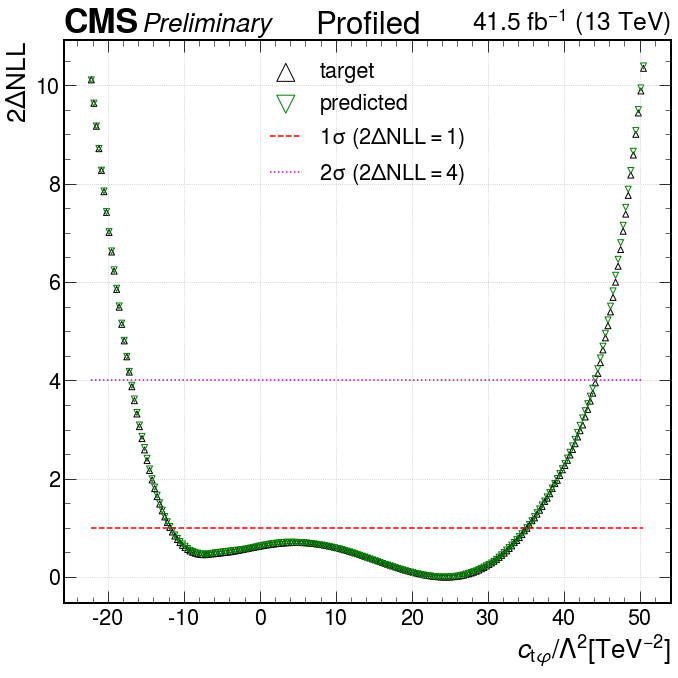

In [38]:
# Then make the graphs
profiled_1d_graphs = {}
for key in names.keys():
    # Now have to shift because training data is shifted to 0
    target_1d_profiled_data[key]['2dNLL'] -= target_1d_profiled_data[key]['2dNLL'].min()
    model_1d_profiled_data[key]['2dNLL'] -= model_1d_profiled_data[key]['2dNLL'].min()
    #model_1d_profiled_data[key]['2dNLL'] -= 0.34523553 # unshift, see readme for reason of this value
    profiled_1d_graphs[key] = plt.subplots()
    hep.cms.label('Preliminary', data=True, lumi=41.5)
    target_scatter = profiled_1d_graphs[key][1].scatter(target_1d_profiled_data[key][key], target_1d_profiled_data[key]['2dNLL'], marker='^', c='none', ec='k')
    model_scatter = profiled_1d_graphs[key][1].scatter(model_1d_profiled_data[key]['all_WCs'][:,names[key]], model_1d_profiled_data[key]['2dNLL'], marker='v', c='none', ec='g')
    one_line, = profiled_1d_graphs[key][1].plot([target_1d_profiled_data[key][key].min(), target_1d_profiled_data[key][key].max()], [1,1], 'r--')
    four_line, = profiled_1d_graphs[key][1].plot([target_1d_profiled_data[key][key].min(), target_1d_profiled_data[key][key].max()], [4,4], 'm:')
    profiled_1d_graphs[key][1].grid()
    profiled_1d_graphs[key][1].legend([target_scatter, model_scatter, one_line, four_line], ['target', 'predicted', '$1\sigma\ (2\Delta NLL=1)$', '$2\sigma\ (2\Delta NLL=4)$'], markerscale=3)
    profiled_1d_graphs[key][1].set_xlabel(labels[key])
    profiled_1d_graphs[key][1].set_ylabel('2$\Delta$NLL')
    profiled_1d_graphs[key][1].set_title('Profiled')
    profiled_1d_graphs[key][0].tight_layout()

zoomed_profiled_1d_graphs = {}
for key in names.keys():
    target_1d_zoomed_profiled_data[key]['2dNLL'] -= target_1d_zoomed_profiled_data[key]['2dNLL'].min()
    model_1d_zoomed_profiled_data[key]['2dNLL'] -= model_1d_zoomed_profiled_data[key]['2dNLL'].min()
    #model_1d_zoomed_profiled_data[key]['2dNLL'] -= 0.34523553
    zoomed_profiled_1d_graphs[key] = plt.subplots()
    hep.cms.label('Preliminary', data=True, lumi=41.5)
    target_scatter = zoomed_profiled_1d_graphs[key][1].scatter(target_1d_zoomed_profiled_data[key][key], target_1d_zoomed_profiled_data[key]['2dNLL'], marker='^', c='none', ec='k')
    model_scatter = zoomed_profiled_1d_graphs[key][1].scatter(model_1d_zoomed_profiled_data[key]['all_WCs'][:,names[key]], model_1d_zoomed_profiled_data[key]['2dNLL'], marker='v', c='none', ec='g')
    one_line, = zoomed_profiled_1d_graphs[key][1].plot([target_1d_zoomed_profiled_data[key][key].min(), target_1d_zoomed_profiled_data[key][key].max()], [1,1], 'r--')
    four_line, = zoomed_profiled_1d_graphs[key][1].plot([target_1d_zoomed_profiled_data[key][key].min(), target_1d_zoomed_profiled_data[key][key].max()], [4,4], 'm:')
    zoomed_profiled_1d_graphs[key][1].grid()
    zoomed_profiled_1d_graphs[key][1].legend([target_scatter, model_scatter, one_line, four_line], ['target', 'predicted', '$1\sigma\ (2\Delta NLL=1)$', '$2\sigma\ (2\Delta NLL=4)$'], markerscale=3)
    zoomed_profiled_1d_graphs[key][1].set_xlabel(labels[key])
    zoomed_profiled_1d_graphs[key][1].set_ylabel('2$\Delta$NLL')
    zoomed_profiled_1d_graphs[key][1].set_title('Profiled')
    zoomed_profiled_1d_graphs[key][0].tight_layout()

In [39]:
# Save the graphs
for key in profiled_1d_graphs.keys():
    pp.savefig(profiled_1d_graphs[key][0])
for key in zoomed_profiled_1d_graphs.keys():
    pp.savefig(zoomed_profiled_1d_graphs[key][0])

In [40]:
# 2D real profiled graphs compared to Combine scans
# For target data see before
# Load data first
model_2d_profiled_data = validation_data['model_2d_profiled_data'].item()

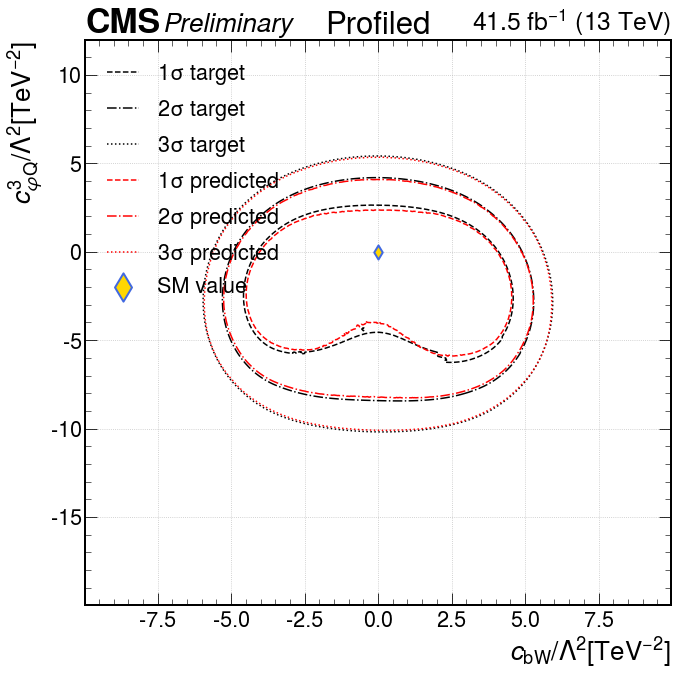

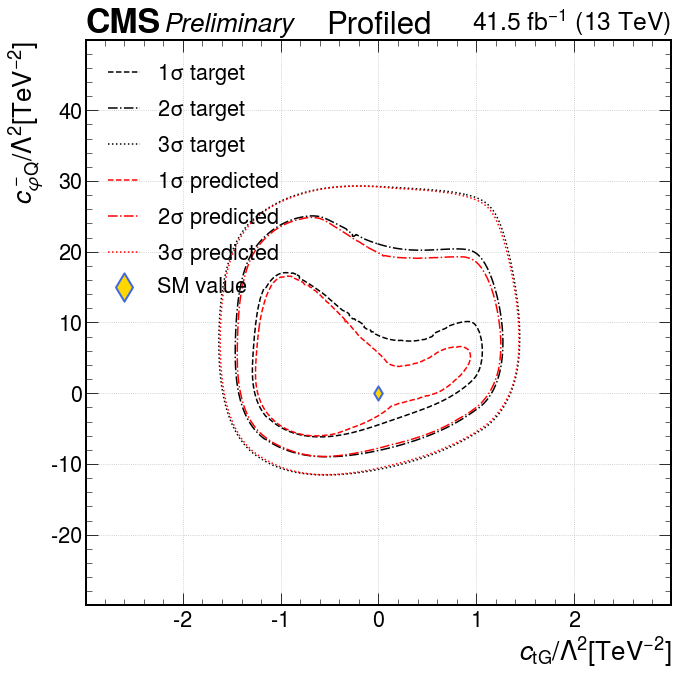

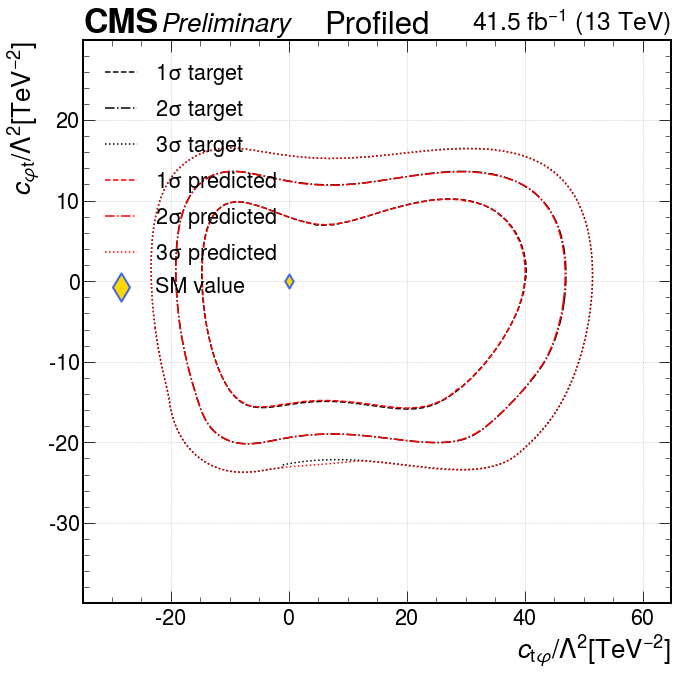

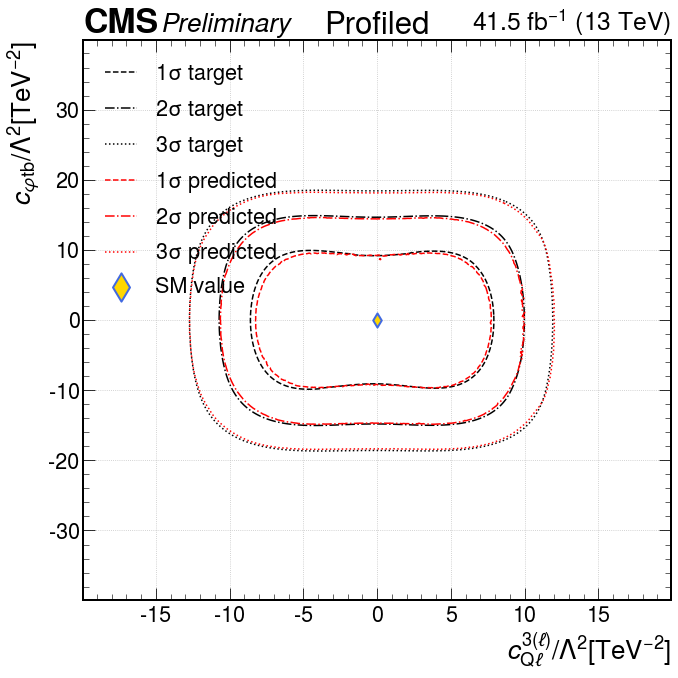

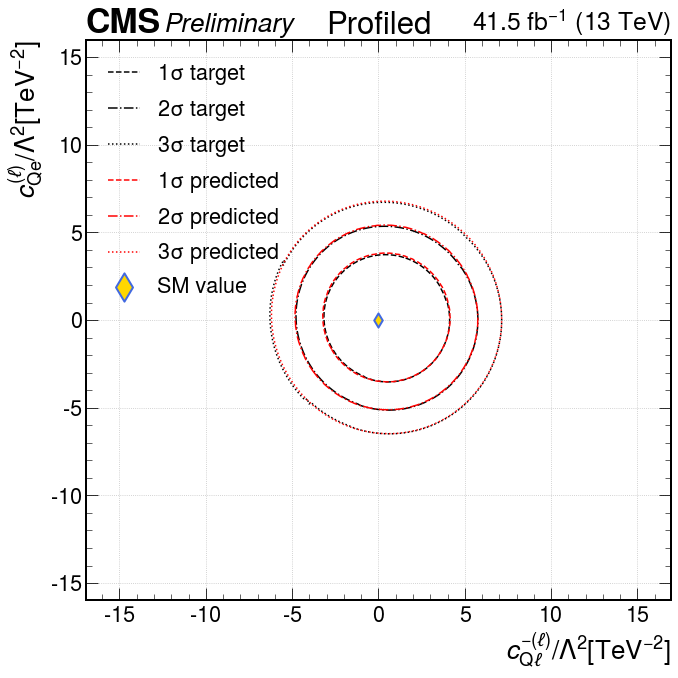

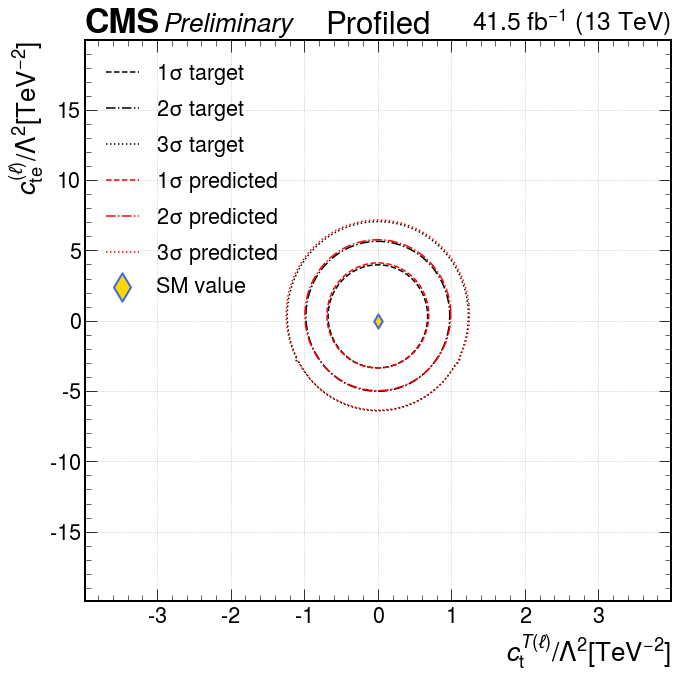

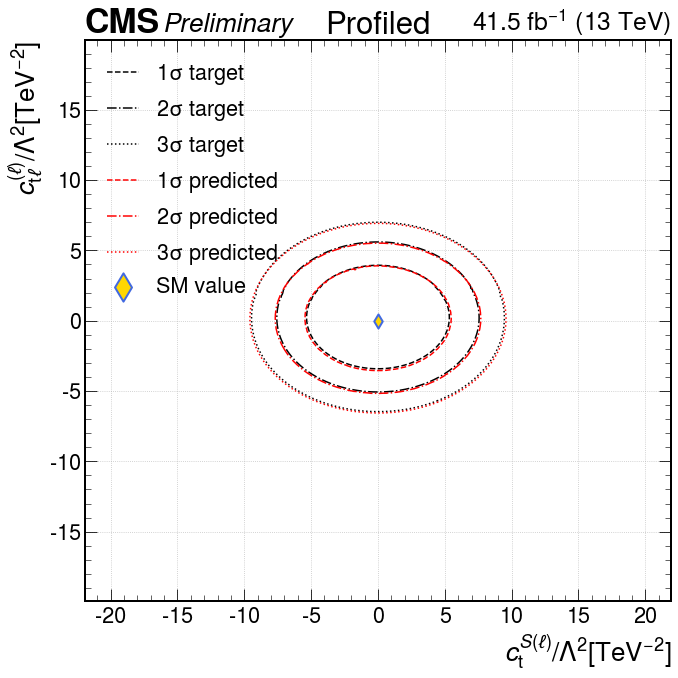

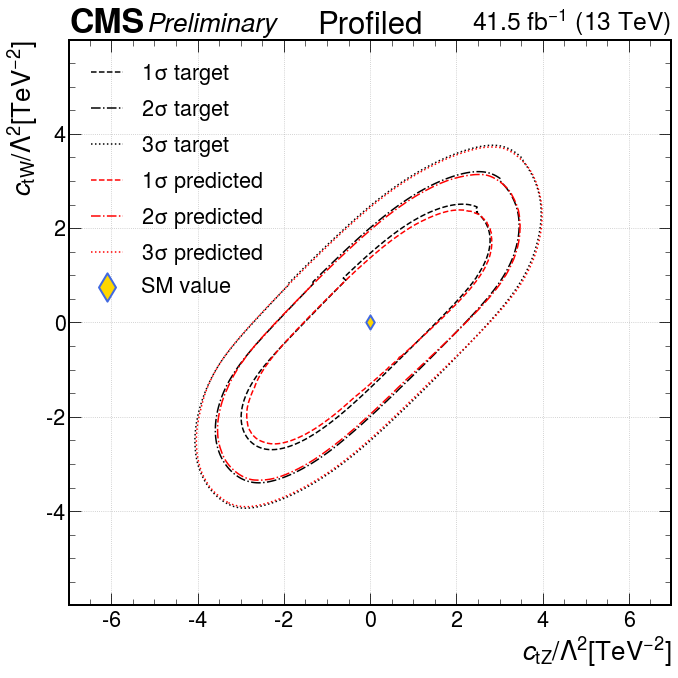

In [41]:
# Then make the graphs
# 2D real profiled graphs compared to Combine scans
profiled_2d_graphs = {}
for num in np.arange(8):
    target_2d_profiled_data[str(num)]['2dNLL'] -= target_2d_profiled_data[str(num)]['2dNLL'].min()
    model_2d_profiled_data[str(num)]['2dNLL'] -= model_2d_profiled_data[str(num)]['2dNLL'].min()
    profiled_2d_graphs[str(num)] = plt.subplots()
    hep.cms.label('Preliminary', data=True, lumi=41.5)
    target_contour = profiled_2d_graphs[str(num)][1].tricontour(target_2d_profiled_data[str(num)]['all_WCs'][:, names[WC2d_2[num]]], target_2d_profiled_data[str(num)]['all_WCs'][:, names[WC2d_1[num]]], target_2d_profiled_data[str(num)]['2dNLL'], colors='k', linestyles=['dashed', 'dashdot', 'dotted'], levels=[2.30, 6.18, 11.83]) # 1, 2, and 3 sigmas
    model_contour = profiled_2d_graphs[str(num)][1].tricontour(model_2d_profiled_data[str(num)]['all_WCs'][:, names[WC2d_2[num]]], model_2d_profiled_data[str(num)]['all_WCs'][:, names[WC2d_1[num]]], model_2d_profiled_data[str(num)]['2dNLL'], colors='r', linestyles=['dashed', 'dashdot', 'dotted'], levels=[2.30, 6.18, 11.83]) # 1, 2, and 3 sigmas
    SM_value = profiled_2d_graphs[str(num)][1].scatter(0, 0, marker='d', c='gold', ec='royalblue', s=100, linewidths=2, zorder=10)
    profiled_2d_graphs[str(num)][1].grid()
    profiled_2d_graphs[str(num)][1].legend(target_contour.collections+model_contour.collections+[SM_value], ['$1\sigma$ target', '$2\sigma$ target', '$3\sigma$ target', '$1\sigma$ predicted', '$2\sigma$ predicted', '$3\sigma$ predicted', 'SM value'], loc='upper left', markerscale=2)
    profiled_2d_graphs[str(num)][1].set_xlabel(labels[WC2d_2[num]])
    profiled_2d_graphs[str(num)][1].set_ylabel(labels[WC2d_1[num]])
    profiled_2d_graphs[str(num)][1].set_title('Profiled')
    profiled_2d_graphs[str(num)][0].tight_layout()

In [42]:
# Save the graphs
for key in profiled_2d_graphs.keys():
    pp.savefig(profiled_2d_graphs[key][0])

In [43]:
# Load analysis data
analysis_data = np.load(f'./saved_graphs/{out_file}_analysis.npz', allow_pickle=True)

In [44]:
# First print the change of basis matrix
# Load data first
change_basis = analysis_data['model_2d_frozen_data'].item()['0']['change_basis']

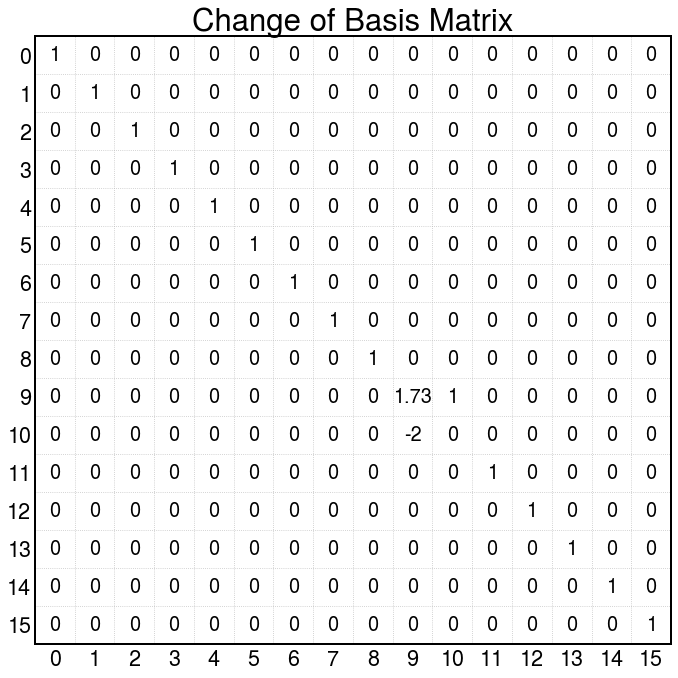

In [45]:
# The make the graph
change_basis_graph = plt.subplots()
#change_basis_graph[1].matshow(model_2d_frozen_data['0']['change_basis'], cmap=plt.cm.Blues)
for i in np.arange(change_basis.shape[0]):
    for j in np.arange(change_basis.shape[1]):
        c = change_basis[j,i]
        change_basis_graph[1].text(i, j, f'{c:.3g}', va='center', ha='center', size=20)
change_basis_graph[1].set_xlim(-0.5, change_basis.shape[1]-0.5)
change_basis_graph[1].set_ylim(change_basis.shape[0]-0.5, -0.5)
change_basis_graph[1].set_xticks(np.arange(0, change_basis.shape[1], 1))
change_basis_graph[1].set_yticks(np.arange(0, change_basis.shape[0], 1))
change_basis_graph[1].xaxis.set_minor_locator(FixedLocator(np.arange(0.5, change_basis.shape[1]+1.5, 1)))
change_basis_graph[1].yaxis.set_minor_locator(FixedLocator(np.arange(0.5, change_basis.shape[0]+1.5, 1)))
change_basis_graph[1].grid(which='minor')
change_basis_graph[1].xaxis.set_tick_params(which='major', bottom=False, top=False)
change_basis_graph[1].yaxis.set_tick_params(which='major', bottom=False, top=False)
change_basis_graph[1].xaxis.set_tick_params(which='minor', bottom=False, top=False)
change_basis_graph[1].yaxis.set_tick_params(which='minor', bottom=False, top=False)
change_basis_graph[1].set_title('Change of Basis Matrix')
change_basis_graph[0].tight_layout()

In [46]:
# Save the graph
pp.savefig(change_basis_graph[0])

In [47]:
# 2D frozen graphs after change of basis
# Load data first
model_2d_frozen_data = analysis_data['model_2d_frozen_data'].item()

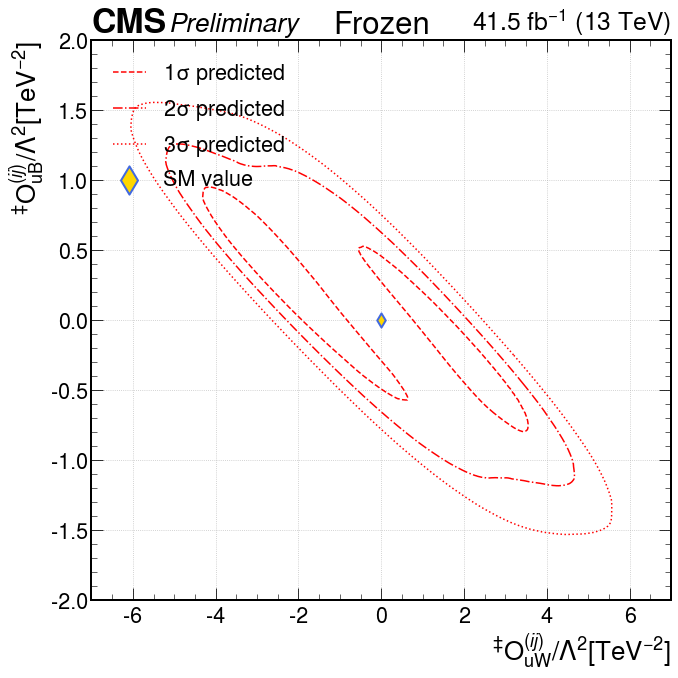

In [48]:
# Then make the graphs
frozen_2d_graphs = {}
for idx in np.arange(1):
    model_2d_frozen_data[str(idx)]['2dNLL'] -= model_2d_frozen_data[str(idx)]['2dNLL'].min()
    frozen_2d_graphs[str(idx)] = plt.subplots()
    hep.cms.label('Preliminary', data=True, lumi=41.5)
    model_contour = frozen_2d_graphs[str(idx)][1].tricontour(model_2d_frozen_data[str(idx)]['x'], model_2d_frozen_data[str(idx)]['y'], model_2d_frozen_data[str(idx)]['2dNLL'], colors='r', linestyles=['dashed', 'dashdot', 'dotted'], levels=[2.30, 6.18, 11.83]) # 1, 2, and 3 sigmas
    SM_value = frozen_2d_graphs[str(idx)][1].scatter(0, 0, marker='d', c='gold', ec='royalblue', s=100, linewidths=2, zorder=10)
    frozen_2d_graphs[str(idx)][1].grid()
    frozen_2d_graphs[str(idx)][1].legend(model_contour.collections+[SM_value], ['$1\sigma$ predicted', '$2\sigma$ predicted', '$3\sigma$ predicted', 'SM value'], loc='upper left', markerscale=2)
    #frozen_2d_graphs[str(idx)][1].set_xlabel(model_2d_frozen_data[str(idx)]['x_label']+r'$/\Lambda^2[TeV^{-2}]$')
    #frozen_2d_graphs[str(idx)][1].set_ylabel(model_2d_frozen_data[str(idx)]['y_label']+r'$/\Lambda^2[TeV^{-2}]$')
    # For CHEP use actual labels
    frozen_2d_graphs[str(idx)][1].set_xlabel(r'$^\ddag O_{uW}^{(\mathit{ij})}/\Lambda^2[TeV^{-2}]$')
    frozen_2d_graphs[str(idx)][1].set_ylabel(r'$^\ddag O_{uB}^{(\mathit{ij})}/\Lambda^2[TeV^{-2}]$')
    
    frozen_2d_graphs[str(idx)][1].set_title('Frozen')
    frozen_2d_graphs[str(idx)][0].tight_layout()

In [49]:
# Save the graphs
for key in frozen_2d_graphs.keys():
    pp.savefig(frozen_2d_graphs[key][0])

In [50]:
# 2D profiled graphs after change of basis
# Load data first
model_2d_profiled_data = analysis_data['model_2d_profiled_data'].item()

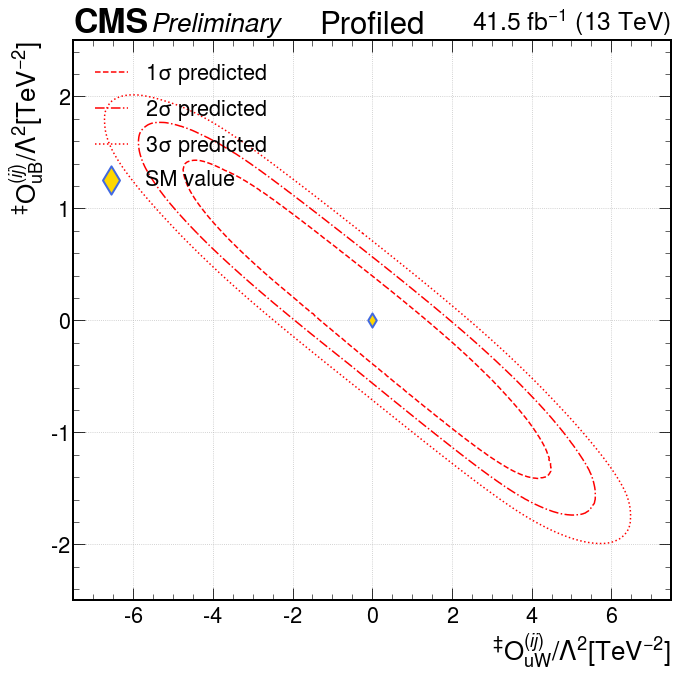

In [51]:
# Then make the graphs
profiled_2d_graphs = {}
for idx in np.arange(1):
    model_2d_profiled_data[str(idx)]['2dNLL'] -= model_2d_profiled_data[str(idx)]['2dNLL'].min()
    profiled_2d_graphs[str(idx)] = plt.subplots()
    hep.cms.label('Preliminary', data=True, lumi=41.5)
    model_contour = profiled_2d_graphs[str(idx)][1].tricontour(model_2d_profiled_data[str(idx)]['x'], model_2d_profiled_data[str(idx)]['y'], model_2d_profiled_data[str(idx)]['2dNLL'], colors='r', linestyles=['dashed', 'dashdot', 'dotted'], levels=[2.30, 6.18, 11.83]) # 1, 2, and 3 sigmas
    SM_value = profiled_2d_graphs[str(idx)][1].scatter(0, 0, marker='d', c='gold', ec='royalblue', s=100, linewidths=2, zorder=10)
    profiled_2d_graphs[str(idx)][1].grid()
    profiled_2d_graphs[str(idx)][1].legend(model_contour.collections+[SM_value], ['$1\sigma$ predicted', '$2\sigma$ predicted', '$3\sigma$ predicted', 'SM value'], loc='upper left', markerscale=2)
    #profiled_2d_graphs[str(idx)][1].set_xlabel(model_2d_profiled_data[str(idx)]['x_label']+r'$/\Lambda^2[TeV^{-2}]$')
    #profiled_2d_graphs[str(idx)][1].set_ylabel(model_2d_profiled_data[str(idx)]['y_label']+r'$/\Lambda^2[TeV^{-2}]$')
    # For CHEP use actual labels
    profiled_2d_graphs[str(idx)][1].set_xlabel(r'$^\ddag O_{uW}^{(\mathit{ij})}/\Lambda^2[TeV^{-2}]$')
    profiled_2d_graphs[str(idx)][1].set_ylabel(r'$^\ddag O_{uB}^{(\mathit{ij})}/\Lambda^2[TeV^{-2}]$')
    
    profiled_2d_graphs[str(idx)][1].set_title('Profiled')
    profiled_2d_graphs[str(idx)][0].tight_layout()

In [52]:
# Save the graphs
for key in profiled_2d_graphs.keys():
    pp.savefig(profiled_2d_graphs[key][0])

In [53]:
# Save the graphs to files
pp.close()